# System Preparation

## Install requirements

In [1]:
import importlib
import subprocess
try:
    # Check if the module is already installed
    importlib.import_module('torch')
    print("torch is already installed.")
except ImportError:
    # If the module is not installed, try installing it
    subprocess.run(['pip3', 'install', 'torch', 'torchvision', 'torchaudio', '--index-url', 'https://download.pytorch.org/whl/cu118'])
    print("torch was installed correctly.")

import torch
print("Torch version:",torch.__version__)
print("Is CUDA enabled?",torch.cuda.is_available())
if torch.cuda.is_available():
    print(torch.randn(1).cuda())
else:
    #get torch here: https://pytorch.org/get-started/locally/
    subprocess.run(['pip3', 'uninstall', 'torch'])
    subprocess.run(['pip3', 'install', 'torch', 'torchvision', 'torchaudio', '--index-url', 'https://download.pytorch.org/whl/cu118'])

torch is already installed.
Torch version: 2.1.1+cu118
Is CUDA enabled? True
tensor([-1.7093], device='cuda:0')


In [ ]:
#install requirements
!pip install nltk  
!pip install gdown
!pip install pandas
!pip install bertopic
!pip install networkx
!pip install wordcloud
!pip install matplotlib
!pip install bertopic[visualization]  #This has to be installed separately

## Import packages

In [24]:
# Import packages
import os
import io
import sys
import ast
import re
import string
import random
import zipfile
import requests
import time
import numpy as np
import pandas as pd
import networkx as nx
from tqdm import tqdm
import matplotlib.pyplot as plt
from datetime import datetime
if not 'google.colab' in sys.modules:
    !pip install pyperclip
    import pyperclip as pc

# Plotly: Set notebook mode to work offline
import plotly.offline as pyo
import plotly.graph_objs as go
pyo.init_notebook_mode()

# Set data directory
save_path = 'data/'

# Set working directory
if 'notebooks' in os.getcwd():
    print(os.getcwd())
    os.chdir(os.path.dirname(os.getcwd()))
    print('cwd:', os.getcwd())


###### Define Notebook functions  ######

def simple_bool(message):
    choose = input(message+" (y/n): ").lower()
    your_bool = choose in ["y", "yes","yea","sure"]
    return your_bool

# Source Dataset Import:
def get_and_extract(file, dir = os.getcwd(), ext = '.zip'):
    url='https://zenodo.org/record/8205724/files/'+file+'.zip?download=1'
    zip_file_name = file+ext
    extracted_folder_name = dir
    # Download the ZIP file
    response = requests.get(url)
    if response.status_code == 200:
        # Extract the ZIP contents
        with io.BytesIO(response.content) as zip_buffer:
            with zipfile.ZipFile(zip_buffer, 'r') as zip_ref:
                zip_ref.extractall(extracted_folder_name)
        print(f"ZIP file '{zip_file_name}' extracted to '{extracted_folder_name}' successfully.")
    else:
        print("Failed to download the ZIP file.")

# Data Processing
def get_gitfile(url, flag='', dir = os.getcwd()):
    url = url.replace('blob','raw')
    response = requests.get(url)
    file_name = flag + url.rsplit('/',1)[1]
    file_path = os.path.join(dir, file_name)
    if response.status_code == 200:
        with open(file_path, 'wb') as file:
            file.write(response.content)
        print(f"File downloaded successfully. Saved as {file_name}")
    else:
        print("Unable to download the file.")

def pmid_str(df, col= 'pmids'):
    df[col] = df[col].astype(str)

def load_preprocessed(doc_name = 'abs_preprocessed_251.txt'):
    with open(save_path+doc_name, 'r',encoding='utf-8') as file:
        docs_processed = []
        for line in file:
            docs_processed.append(str(line.strip()))

    print("Imported list:", doc_name)
    return docs_processed

def generate_random_name(length):
    letters = string.ascii_lowercase
    return ''.join(random.choice(letters) for i in range(length))

# Topic model functions:
def generate_labels(n_words= 3, l_word = 8, cut_off = 15, sep = " ", prefix = True, pad = False, common_length = 30):
    topic_labels = topic_model.generate_topic_labels(nr_words     = n_words,
                                                     topic_prefix = prefix,
                                                     word_length  = l_word,
                                                     separator    = sep)
    if pad:
        padded_list = [s.ljust(common_length) + " "  if len(s) < common_length else s[:common_length] + " "  for s in topic_labels]
        topic_labels = [s.replace(' ', ' ') for s in padded_list]
    else:
        topic_labels = [label[:cut_off] for label in topic_labels]
    return topic_labels

# Retrieval from source functions:
def get_pmids(topic_id):
    len(doc_info[doc_info.Topic == topic_id])
    doc_topic = doc_info[doc_info.Topic == topic_id]
    pmid_topic = doc_topic.pubmed_id.reset_index(drop=True).astype(str)
    return pmid_topic

def get_genes(topic_id):
    genes_topic = grpm_dataset[grpm_dataset['pmids'].isin(get_pmids(topic_id))].gene.drop_duplicates().reset_index(drop=True)
    return genes_topic


# Import Source Datasets
https://zenodo.org/record/8205724  DOI: 10.5281/zenodo.8205724

### Import GRPM dataset

In [13]:
if not os.path.exists("grpm_dataset/grpm_db_pcg/grpm_table_output.csv"):
    print('Downloading source Dataset from Zenodo')
    time_ = datetime.now()
    get_and_extract('grpm_dataset')
    print('Download and extraction time ',datetime.now()-time_)

grpm_dataset = pd.read_csv("grpm_dataset/grpm_db_pcg/grpm_table_output.csv", index_col=0).reset_index(drop=True)
grpm_dataset_rna = pd.read_csv("grpm_dataset/grpm_db_rna/grpm_table_output.csv", index_col=0).reset_index(drop=True)
grpm_dataset_pseudo = pd.read_csv("grpm_dataset/grpm_db_pseudo/grpm_table_output.csv", index_col=0).reset_index(drop=True)

pmid_str(grpm_dataset)
pmid_str(grpm_dataset_rna)
pmid_str(grpm_dataset_pseudo)

print('nbib dataset shape:',grpm_dataset.shape)
grpm_dataset.head()

nbib dataset shape: (16610132, 6)


,gene,rsid,pmids,mesh,qualifier,major
0,MT-ND1,rs1057520201,17454741,Amino Acid Substitution,NaN,False
1,MT-ND1,rs1057520201,17454741,"DNA, Mitochondrial",genetics,True
2,MT-ND1,rs1057520201,17454741,Female,NaN,False
3,MT-ND1,rs1057520201,17454741,Genotype,NaN,False
4,MT-ND1,rs1057520201,17454741,Humans,NaN,False


### Import NBIB dataset

In [ ]:
if not os.path.exists("grpm_dataset\grpm_db_pcg\complete_nbibtable.csv"):
    if simple_bool('Download nbib-data from Zenodo?\n (size: 5GB unpacked; average import time: 7'')'):
        timea = datetime.now()
        get_and_extract('nbib_data')
        print('Download and extraction time: ',datetime.now()-timea)
    else:
        pass

In [13]:
nbib_dataset = pd.read_csv("grpm_dataset\grpm_db_pcg\complete_nbibtable.csv", index_col=0).dropna(subset=['descriptors']).reset_index(drop=True)
print('nbib dataset shape:',nbib_dataset.shape)
nbib_dataset.head()

nbib dataset shape: (584482, 36)


,gene,pubmed_id,citation_owner,nlm_status,last_revision_date,electronic_issn,linking_issn,journal_volume,journal_issue,publication_date,...,revised_time,accepted_time,pubmed_time,medline_time,entrez_time,pii,doi,publication_status,print_issn,pages
0,MT-ND1,29980632,NLM,MEDLINE,2018-12-11,1744-1358,0071-1365,62,3,2018 Jul 20,...,2018-05-20,2018-05-23,2018-07-08 06:00:00,2018-12-12 06:00:00,2018-07-08 06:00:00,EBC20170114,10.1042/EBC20170114,epublish,0071-1365,467-481
1,MT-ND1,29133631,NLM,MEDLINE,2019-03-27,1998-3689,0301-4738,65,11,2017 Nov,...,NaN,NaN,2017-11-15 06:00:00,2017-12-19 06:00:00,2017-11-15 06:00:00,IJO-65-1087,10.4103/ijo.IJO_358_17,ppublish,0301-4738,1087-1092
2,MT-ND1,31996241,NLM,MEDLINE,2021-02-01,1750-1172,1750-1172,15,1,2020 Jan 29,...,NaN,2020-01-05,2020-01-31 06:00:00,2021-02-02 06:00:00,2020-01-31 06:00:00,1297,10.1186/s13023-020-1297-9,epublish,NaN,31
3,MT-ND1,33159657,NLM,MEDLINE,2021-10-25,1179-1950,0012-6667,81,1,2021 Jan,...,NaN,NaN,2020-11-08 06:00:00,2021-10-26 06:00:00,2020-11-07 12:06:00,1428,10.1007/s40265-020-01428-3,ppublish,0012-6667,57-86
4,MT-ND1,33185731,NLM,MEDLINE,2021-08-24,1435-702X,0721-832X,259,9,2021 Sep,...,2020-09-16,2020-10-23,2020-11-14 06:00:00,2021-08-25 06:00:00,2020-11-13 12:10:00,10.1007/s00417-020-04993-1,10.1007/s00417-020-04993-1,ppublish,NaN,2461-2472


### Import MeSH Terms

In [3]:
# load reference MeSH terms
df_mesh = pd.read_csv(save_path+'ref-mesh.csv')['Preferred Label']
list_mesh = df_mesh.to_list()
docs_mesh = str(list_mesh)
mesh_count = len(list_mesh)
print('MeSH list count:',mesh_count)
print('MeSH list sample:',list_mesh[0:10])
df_mesh

MeSH list count: 251
MeSH list sample: ['Food Additives', 'Pesticides', 'Soil Pollutants', 'Water Pollutants, Chemical', 'Environmental Pollutants', 'Toxicity Tests, Acute', 'Toxicogenetics', 'Liver Diseases, Alcoholic', 'Forensic Toxicology', 'Toxicology']


0                  Food Additives
1                      Pesticides
2                 Soil Pollutants
3      Water Pollutants, Chemical
4        Environmental Pollutants
                  ...            
246                 Food Handling
247             Food Preservation
248                Food Fussiness
249          Food Coloring Agents
250            Food Preservatives
Name: Preferred Label, Length: 251, dtype: object

# Data Preprocessing

## NBIB filtering by MeSH

In [16]:
%%time
# filtering source dataset
nbib_subset = pd.DataFrame(columns= nbib_dataset.columns)
filteres_grpm = grpm_dataset[grpm_dataset.mesh.isin(list_mesh)]

nbib_dataset.pubmed_id = nbib_dataset.pubmed_id.astype(str)
nbib_subset = nbib_dataset[nbib_dataset.pubmed_id.isin(filteres_grpm.pmids.drop_duplicates())]

print('pubmed id count:',nbib_subset.pubmed_id.nunique())
print('pubmed id with abstract count:',nbib_subset.abstract.nunique()-1)
nbib_subset.head()

pubmed id count: 37516
pubmed id with abstract count: 37036
CPU times: total: 1.44 s
Wall time: 1.62 s


,gene,pubmed_id,citation_owner,nlm_status,last_revision_date,electronic_issn,linking_issn,journal_volume,journal_issue,publication_date,...,revised_time,accepted_time,pubmed_time,medline_time,entrez_time,pii,doi,publication_status,print_issn,pages
1,MT-ND1,29133631,NLM,MEDLINE,2019-03-27,1998-3689,0301-4738,65,11,2017 Nov,...,NaN,NaN,2017-11-15 06:00:00,2017-12-19 06:00:00,2017-11-15 06:00:00,IJO-65-1087,10.4103/ijo.IJO_358_17,ppublish,0301-4738,1087-1092
5,MT-ND1,33465056,NLM,MEDLINE,2021-09-29,1558-8238,0021-9738,131,6,2021 Mar 15,...,NaN,2021-01-14,2021-01-20 06:00:00,2021-09-30 06:00:00,2021-01-19 17:11:00,138267,10.1172/JCI138267,ppublish,0021-9738,NaN
7,MT-ND1,34445694,NLM,MEDLINE,2021-09-29,1422-0067,1422-0067,22,16,2021 Aug 20,...,2021-08-13,2021-08-17,2021-08-28 06:00:00,2021-09-30 06:00:00,2021-08-27 01:25:00,ijms-22-08990,10.3390/ijms22168990,epublish,NaN,NaN
10,MT-ND1,34065857,NLM,MEDLINE,2021-06-10,1422-0067,1422-0067,22,10,2021 May 12,...,2021-04-30,2021-05-06,2021-06-03 06:00:00,2021-06-11 06:00:00,2021-06-02 01:14:00,ijms-22-05100,10.3390/ijms22105100,epublish,NaN,NaN
17,MT-ND1,28906532,NLM,MEDLINE,2022-12-07,1680-0745,1015-9657,29,2,2018 Mar/Apr 23,...,NaN,2017-07-17,2017-09-15 06:00:00,2019-02-05 06:00:00,2017-09-15 06:00:00,NaN,10.5830/CVJA-2017-037,ppublish,1995-1892,122-132


### save/load NBIB subset

In [ ]:
if simple_bool('save nbib subset?'):
    nbib_subset.reset_index(drop=True).to_csv(save_path+'nbib_subset_'+str(mesh_count)+'.csv')

In [ ]:
# Load NBIB Subset 
nbib_subset = pd.read_csv(save_path+'nbib_subset_251.csv', index_col=0)
print('nbib subset shape:', nbib_subset.shape)

## NBIB subset cleaning

In [ ]:
if simple_bool('load nbib_subset_clean?'):
    nbib_subset_clean = pd.read_csv(save_path+'nbib_subset_251.csv', index_col=0)
    pmid_str(nbib_subset_clean, 'pubmed_id')
    docs = nbib_subset_clean.combined.drop_duplicates().to_list()
else:
    # get only pubmed_id with abstract:
    nbib_subset_clean = nbib_subset[['gene', 'pubmed_id', 'publication_date', 'title','abstract', 'authors', 'publication_types','place_of_publication','nlm_journal_id', 'descriptors', 'keywords',  'pii', 'doi', 'publication_status']].drop_duplicates().dropna(subset='abstract')
    pmid_str(nbib_subset_clean, 'pubmed_id')
    
    # add PMID to abstract (flag):
    nbib_subset_clean['combined'] = nbib_subset_clean['pubmed_id'].astype('str') + ' $ ' + nbib_subset_clean['abstract']

def display_sub():
    print('nbib subset shape:',nbib_subset_clean.shape)
    print('pubmed id count:', nbib_subset_clean.pubmed_id.nunique())
    print('abstract count:', nbib_subset_clean.abstract.nunique())
    #nbib_subset_clean[['gene', 'pubmed_id', 'publication_date', 'authors', 'publication_types','nlm_journal_id', 'descriptors', 'keywords']].head().to_clipboard()
    display(nbib_subset_clean.head())

display_sub()

In [ ]:
if simple_bool('save nbib_subset_clean?'):
    nbib_subset_clean.reset_index(drop=True).to_csv(save_path+'nbib_subset_clean_'+str(mesh_count)+'.csv')

## Source Dataset Statistics

In [ ]:
nbib_subset_clean = pd.read_csv(save_path+'nbib_subset_clean_251.csv')
pmid_str(nbib_subset_clean, 'pubmed_id')

In [7]:
filteres_grpm = grpm_dataset[grpm_dataset.mesh.isin(list_mesh)]
filteres_grpm = filteres_grpm[['gene', 'rsid', 'pmids', 'mesh']].drop_duplicates()
filteres_grpm.describe().to_clipboard()

print('Original Dataset')
display(grpm_dataset[['gene', 'rsid', 'pmids', 'mesh']].drop_duplicates().describe())

print('Filtered by MeSH')
display(filteres_grpm.describe())

Original Dataset


,gene,rsid,pmids,mesh
count,14253190,14253190,14253190,14253190
unique,15519,300239,260587,21755
top,TP53,rs1801133,34578986,Humans
freq,179941,71972,7904,947650


Filtered by MeSH


,gene,rsid,pmids,mesh
count,163628,163628,163628,163628
unique,8270,45456,37516,251
top,TNF,rs1800629,34578986,Inflammation
freq,3915,2012,832,13179


Data Preprocessed for Topic Modeling:


,gene,pubmed_id
count,74474,74474
unique,8280,37042
top,TNF,17601350
freq,1910,111


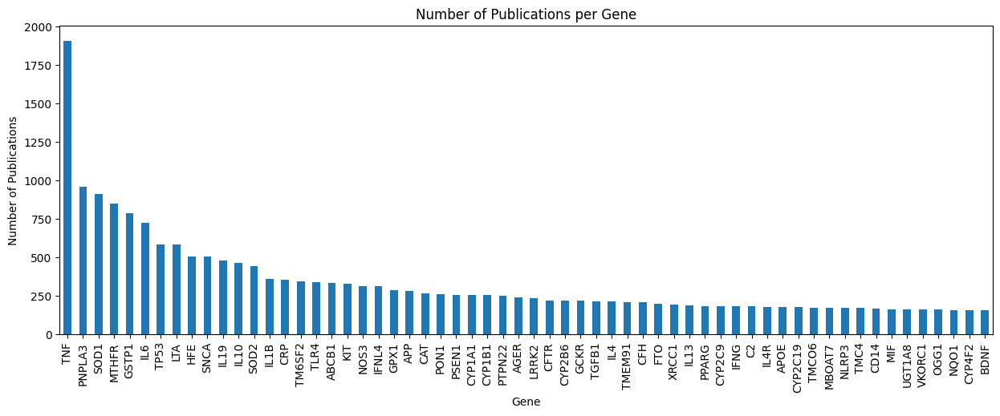

In [26]:
# Stats
keep_l = ['gene', 'pubmed_id', 'publication_date', 'authors', 'publication_types','nlm_journal_id', 'descriptors', 'keywords']
keep_s = ['gene', 'pubmed_id']
data = nbib_subset_clean[keep_s]#.dropna(subset=['authors'])#, 'descriptors'])

# Statistics
#data['authors'] = data['authors'].apply(ast.literal_eval)
#data['publication_types'] = data['publication_types'].apply(ast.literal_eval)
#data['descriptors'] = data['descriptors'].apply(ast.literal_eval)
#data['keywords'] = data['keywords'].apply(ast.literal_eval)

# Display basic statistics
print('Data Preprocessed for Topic Modeling:')
display(data.describe())

# Number of Publications per Gene
gene_counts = data['gene'].value_counts()
plt.figure(figsize=(15, 5))
gene_counts.head(60).plot(kind='bar')
plt.title('Number of Publications per Gene')
plt.xlabel('Gene')
plt.ylabel('Number of Publications')
plt.show()

## Prepare abstracts

In [ ]:
# Load NBIB subset combined
if 'nbib_subset_clean' not in globals():
    print('Loading nbib subset')
    nbib_subset_clean = pd.read_csv(save_path+'nbib_subset_clean_251.csv', index_col=0)
    docs = nbib_subset_clean.combined.drop_duplicates().to_list()
else:
    docs = nbib_subset_clean.combined.drop_duplicates().to_list()

print('PMID count:',nbib_subset.pubmed_id.nunique(),  
      '\nabstract count:',nbib_subset_clean.abstract.nunique(), 
      '\nPMID without abstract:',nbib_subset.pubmed_id.nunique()-nbib_subset_clean.abstract.nunique())

## Corpus normalization

### - NLTK text preprocessing (optional)
1.  import nltk for stemming and stopword removal
2.  remove stopwords and then stem the abstracts

In [ ]:
#download stopwords and the punkt tokenizer
import nltk
nltk.download('stopwords')
nltk.download('punkt')

#tokenize, remove stopwords and stem
# import nltk for stemming and stopword removal
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
import time
import random
stop_words = set(stopwords.words('english'))
stemmer = PorterStemmer()

def stem_and_remove_stopwords(text):
    word_tokens = word_tokenize(text)
    lowercase_tokens = [word.lower() for word in word_tokens] #lower
    filtered_text = [word for word in lowercase_tokens if word not in stop_words] #trimming
    stemmed_text = [stemmer.stem(word) for word in filtered_text] #stemming
    return " ".join(stemmed_text)

docs_to_process = docs#[100:1600]#random.sample(docs, 100)

# Normalize docs
timea = time.time()
docs_processed = [stem_and_remove_stopwords(doc) for doc in docs_to_process]
print(time.time()-timea)

print(docs_to_process[1],'\n')
print(docs_processed[1])
len(docs_processed)

### - simple text preprocessing 
(best for BERTopic)

In [21]:
# lower text keeping acronyms uppercase
def lower(text):
    # Split the text into words
    words = text.split()
    # Lowercase the words that don't have consecutive uppercase letters
    processed_words = [word.lower() if not re.search('[A-Z]{2,}', word) else word for word in words]
    # Join the processed words back into text
    processed_text = ' '.join(processed_words)
    return processed_text

# lower text keeping only genes uppercase
''' # Deprecated (too slow)
genes = pd.concat([grpm_dataset.gene, grpm_dataset_rna.gene, grpm_dataset_pseudo.gene])
genes= genes.drop_duplicates().reset_index(drop=True)
genes

def lower_gene(text):
    lowered_text = text.lower()
    for j in range(len(genes)):
        gene = genes[j]
        lowered_text = lowered_text.replace(' '+gene.lower()+' ', ' '+gene+' ')
        lowered_text = lowered_text.replace('('+gene.lower()+')', '('+gene+')')
        lowered_text = lowered_text.replace(' '+gene.lower()+',', ' '+gene+',')
        lowered_text = lowered_text.replace(' '+gene.lower()+'.', ' '+gene+'.')
        if j%100 == 0:
            print(gene.ljust(10), 'remaning:',len(genes)-j)
    return lowered_text
'''

docs_to_process = docs#[100:1600]#random.sample(docs, 100)

# Normalize docs
timea = time.time()
sampled_docs = docs_to_process
docs_str = str(sampled_docs)
docs_lower = lower(docs_str)
docs_processed = ast.literal_eval(docs_lower)
print(time.time()-timea)

print(docs_to_process[1],'\n')
print(docs_processed[1])
len(docs_processed)

15.728033065795898
33465056 $ Leber's hereditary optic neuropathy (LHON) is the most frequent mitochondrial disease and was the first to be genetically defined by a point mutation in mitochondrial DNA (mtDNA). A molecular diagnosis is achieved in up to 95% of cases, the vast majority of which are accounted for by 3 mutations within mitochondrial complex I subunit-encoding genes in the mtDNA (mtLHON). Here, we resolve the enigma of LHON in the absence of pathogenic mtDNA mutations. We describe biallelic mutations in a nuclear encoded gene, DNAJC30, in 33 unsolved patients from 29 families and establish an autosomal recessive mode of inheritance for LHON (arLHON), which to date has been a prime example of a maternally inherited disorder. Remarkably, all hallmarks of mtLHON were recapitulated, including incomplete penetrance, male predominance, and significant idebenone responsivity. Moreover, by tracking protein turnover in patient-derived cell lines and a DNAJC30-knockout cellular model

37042

In [22]:
# Save pruned and stemmed abstracts
if simple_bool('save abs_preprocessed?'):
    doc_name = 'abs_preprocessed_'+str(mesh_count)+'.txt'
    with open(save_path+doc_name, 'w', encoding='utf-8') as file:
        file.write('\n'.join(map(str, docs_processed)))
    print("List saved as "+doc_name)

List saved as abs_preprocessed_251.txt


In [ ]:
# Load docs_processed.txt as a list
load_preprocessed()

# Topic modeling (TM)


1.   Default setting - Vanilla (Extras)
2.   Custom - choose embedding model and set clustering parameters

## Define Parameters

Custom settings
https://maartengr.github.io/BERTopic/getting_started/tips_and_tricks/tips_and_tricks.html

In [16]:
import re
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.vectorizers import ClassTfidfTransformer
from bertopic.representation import MaximalMarginalRelevance
#from bertopic.representation import KeyBERTInspired


# Step 1 Extract embeddings (SBERT)
models = ["allenai-specter",
          "all-mpnet-base-v2",
          "all-MiniLM-L6-v2"
         ] 
    # ref: https://www.sbert.net/docs/pretrained_models.html 
'''
- allenai-specter: model trained on scientific citations and can be used to estimate the similarity of two publications. We can use it to find similar papers. 
- all-mpnet-base-v2: general purpose model, The all-mpnet-base-v2 model provides the best quality
- all-MiniLM-L6-v2: 5 times faster and still offers good quality.
'''
base_embedder = models[0]  # BaseEmbedder
sentence_transformer = SentenceTransformer(base_embedder) # SentenceTransformer


# Step 2 - Reduce dimensionality 
# uniform manifold approximation and projection (UMAP) to reduce the dimension of embeddings
random_state = 1337 #1000 #1337
umap_model = UMAP(n_neighbors  = 15, #num of high dimensional neighbours
                  n_components = 5,  # default:5 #30
                  min_dist     = 0.0, 
                  random_state = random_state) # default:None
            #  ref: https://stackoverflow.com/questions/71320201/how-to-fix-random-seed-for-bertopic


# Step 3 - Cluster reduced embeddings 
# HDBSCAN (hierarchical density-based spatial clustering of applications with Noise)  to generate semantically similar document clusters. 
# Since HDBSCAN is a density-based clustering algorithm, the number of clusters is automatically chosen based on the minimum distance to be considered as a neighbor. 
min_cluster_size = 100 #5 default HDBSCAN()
hdbscan_model = HDBSCAN(min_cluster_size = min_cluster_size,
                        metric='euclidean', 
                        cluster_selection_method='eom', 
                        prediction_data=True)


# Step 4 - Tokenize topics 
vectorizer_model = CountVectorizer(stop_words="english", lowercase=False) # lowercase=False to keep genes uppercase


# Step 5 - Create topic representation
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True) # False default


# Step 6 - Fine-tune topic representations with a bertopic.representation model
# Create your representation model
representation_model = MaximalMarginalRelevance(diversity = 0.7,  # 0.1 default
                                                top_n_words = 15) # 10 default
#representation_model = KeyBERTInspired()


# Use the representation model in BERTopic on top of the default pipeline

# All steps together
topic_model = BERTopic(
    min_topic_size = 10,                         # 10 default
    top_n_words = 15,                            # 10 default
    calculate_probabilities = True,
    embedding_model = sentence_transformer,      # Step 1 - Extract embeddings
    umap_model = umap_model,                     # Step 2 - Reduce dimensionality
    hdbscan_model = hdbscan_model,               # Step 3 - Cluster reduced embeddings
    vectorizer_model = vectorizer_model,         # Step 4 - Tokenize topics
    ctfidf_model = ctfidf_model,                 # Step 5 - Extract topic words
    representation_model= representation_model  # Step 6 - (Optional) Fine-tune topic represenations
)

In [17]:
len(docs_processed)

1295

## Fit Transform

In [ ]:
# Fit Transform
#topics, probs = topic_model.fit_transform(docs_processed)
#topics_fit = topic_model.fit(docs_processed)

In [ ]:
## If you want to split embedding phase, use it as follows:

# Step 1 Embedding documents with sentence_transformer
embedding_file = 'nbib_subset_clean_251_embeddings_v2.txt'

if simple_bool('Load pre-generated embeddings?'):
    embeddings = np.loadtxt(save_path + embedding_file)
else:
    embeddings = sentence_transformer.encode(docs_processed,
                                       show_progress_bar=True)
print(embeddings.shape)

In [68]:
%%time
# Get Topic Model using custom embeddings
topics, probs = topic_model.fit_transform(docs_processed, embeddings=embeddings)
#topics = topic_model.fit(docs_processed, embeddings=embeddings)
print('random_state:',random_state)

random_state: 1337


In [69]:
#embeddings_redux = umap_model.fit(embeddings)
#print(embeddings_redux.embedding_.shape)
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,13124,-1_cell_diabetes_human_levels,"[cell, diabetes, human, levels, mutations, pro...",[18399716 $ BACKGROUND: the relevance to coron...
1,0,2549,0_cancer_GSTM1_prostate_exposure,"[cancer, GSTM1, prostate, exposure, arsenic, c...",[23977100 $ BACKGROUND: glutathione s-transfer...
2,1,1774,1_alzheimer_synuclein_parkinson_tau,"[alzheimer, synuclein, parkinson, tau, amyloid...",[23374228 $ BACKGROUND: alzheimer's disease (A...
3,2,1710,2_allergic_ige_atopic_COPD,"[allergic, ige, atopic, COPD, airway, children...",[33179333 $ BACKGROUND: interleukin 10 has bee...
4,3,1157,3_NASH_liver_nonalcoholic_fibrosis,"[NASH, liver, nonalcoholic, fibrosis, steatosi...",[25543233 $ BACKGROUND: host genetic factors h...
5,4,1076,4_hepatitis_HCC_cirrhosis_IL28B,"[hepatitis, HCC, cirrhosis, IL28B, PBC, infect...",[25013899 $ OBJECTIVE: to establish the role o...
6,5,1049,5_redox_heme_oxidation_disulfide,"[redox, heme, oxidation, disulfide, site, ER, ...",[22187934 $ reactive oxygen and nitrogen speci...
7,6,1007,6_deficiency_carnitine_methylmalonic_dehydroge...,"[deficiency, carnitine, methylmalonic, dehydro...",[26110041 $ BACKGROUND: short-chain acyl-coa d...
8,7,958,7_G93A_amyotrophic_sclerosis_cord,"[G93A, amyotrophic, sclerosis, cord, dismutase...",[27551074 $ mutations in superoxide dismutase ...
9,8,887,8_DNA_repair_p53_ATM,"[DNA, repair, p53, ATM, pol, chromatin, breaks...",[19621083 $ cellular response to DNA damage in...


## Save Embeddings

In [ ]:
if simple_bool('save embeddings?'):
    filename = 'nbib_subset_clean_'+str(mesh_count)+'_embeddings.txt'
    np.savetxt(save_path+filename, embeddings)

## Save Topic Model

In [70]:
if simple_bool('Save topics model?'):
    filename= "topic_model_grpm_"+str(mesh_count)+"_rndm"+str(random_state)
    topic_model.save(save_path+filename)
    np.savetxt(save_path+filename+'_probs.txt', probs)

2024-05-10 12:27:54,036 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


2024-05-10 12:27:54,036 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.

# Topic Model Info

## Load Topic Model

In [27]:
from bertopic import BERTopic

# Load topics model
filename= 'topic_model_grpm_251_rndm1337'
topic_model = BERTopic.load(save_path+filename)
probs = np.loadtxt(save_path+filename+'_probs.txt')
display(topic_model.get_topic_info()).head()

if 'docs_processed' not in globals():
    #if simple_bool('load abs_preprocessed?'):
    docs_processed = load_preprocessed()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,13124,-1_cell_diabetes_human_levels,"[cell, diabetes, human, levels, mutations, pro...",[18399716 $ BACKGROUND: the relevance to coron...
1,0,2549,0_cancer_GSTM1_prostate_exposure,"[cancer, GSTM1, prostate, exposure, arsenic, c...",[23977100 $ BACKGROUND: glutathione s-transfer...
2,1,1774,1_alzheimer_synuclein_parkinson_tau,"[alzheimer, synuclein, parkinson, tau, amyloid...",[23374228 $ BACKGROUND: alzheimer's disease (A...
3,2,1710,2_allergic_ige_atopic_COPD,"[allergic, ige, atopic, COPD, airway, children...",[33179333 $ BACKGROUND: interleukin 10 has bee...
4,3,1157,3_NASH_liver_nonalcoholic_fibrosis,"[NASH, liver, nonalcoholic, fibrosis, steatosi...",[25543233 $ BACKGROUND: host genetic factors h...
5,4,1076,4_hepatitis_HCC_cirrhosis_IL28B,"[hepatitis, HCC, cirrhosis, IL28B, PBC, infect...",[25013899 $ OBJECTIVE: to establish the role o...
6,5,1049,5_redox_heme_oxidation_disulfide,"[redox, heme, oxidation, disulfide, site, ER, ...",[22187934 $ reactive oxygen and nitrogen speci...
7,6,1007,6_deficiency_carnitine_methylmalonic_dehydroge...,"[deficiency, carnitine, methylmalonic, dehydro...",[26110041 $ BACKGROUND: short-chain acyl-coa d...
8,7,958,7_G93A_amyotrophic_sclerosis_cord,"[G93A, amyotrophic, sclerosis, cord, dismutase...",[27551074 $ mutations in superoxide dismutase ...
9,8,887,8_DNA_repair_p53_ATM,"[DNA, repair, p53, ATM, pol, chromatin, breaks...",[19621083 $ cellular response to DNA damage in...


AttributeError: 'NoneType' object has no attribute 'head'

## Custom Labels

In [28]:
# Basic custom labels 
topic_model.set_topic_labels(generate_labels(4, 8, 17))
topic_model.get_topic_info()[['Topic', 'Count', 'CustomName']].head()#.to_clipboard()

,Topic,Count,CustomName
0,-1,13124,-1 cell diabetes
1,0,2549,0 cancer GSTM1 pr
2,1,1774,1 alzheime synucl
3,2,1710,2 allergic ige at
4,3,1157,3 NASH liver nona


In [6]:
# Return top n words for a specific topic and their c-TF-IDF scores
print('Top n words for a specific topic and their c-TF-IDF scores')
topic_id = 0
topic = topic_model.get_topic(topic_id, full=False)
pd.DataFrame(topic)#[1].sum()

Top n words for a specific topic and their c-TF-IDF scores


,0,1
0,cancer,0.272107
1,GSTM1,0.218103
2,prostate,0.215379
3,exposure,0.205285
4,arsenic,0.202028
5,colorectal,0.188222
6,CYP1A1,0.187651
7,lung,0.183516
8,XRCC1,0.174869
9,workers,0.170295


## Topic Info

In [5]:
# Return topics with top n words and their c-TF-IDF score
all_topics = topic_model.get_topics()
topic_df = pd.DataFrame(all_topics)#.T#.head()

# Probablities
probs_df = pd.DataFrame(probs)

# Topic FREQ
topic_freq = topic_model.get_topic_freq()
outliers = topic_freq.Count[0]

print('total',topic_freq.Count.sum())
print('outliers',outliers)
print('ingroup',topic_freq.Count.sum()-outliers)

# Topic INFO
topic_info = topic_model.get_topic_info()
topics = topic_info.Topic.to_list()
#print(topic_info.columns)

total 37042
outliers 13124
ingroup 23918


In [6]:
topic_info.head()

,Topic,Count,Name,CustomName,Representation,Representative_Docs
0,-1,13124,-1_cell_diabetes_human_levels,-1 cell diabetes,"[cell, diabetes, human, levels, mutations, pro...",[18399716 $ BACKGROUND: the relevance to coron...
1,0,2549,0_cancer_GSTM1_prostate_exposure,0 cancer GSTM1 pr,"[cancer, GSTM1, prostate, exposure, arsenic, c...",[23977100 $ BACKGROUND: glutathione s-transfer...
2,1,1774,1_alzheimer_synuclein_parkinson_tau,1 alzheime synucl,"[alzheimer, synuclein, parkinson, tau, amyloid...",[23374228 $ BACKGROUND: alzheimer's disease (A...
3,2,1710,2_allergic_ige_atopic_COPD,2 allergic ige at,"[allergic, ige, atopic, COPD, airway, children...",[33179333 $ BACKGROUND: interleukin 10 has bee...
4,3,1157,3_NASH_liver_nonalcoholic_fibrosis,3 NASH liver nona,"[NASH, liver, nonalcoholic, fibrosis, steatosi...",[25543233 $ BACKGROUND: host genetic factors h...


In [ ]:
# Save topic Info
filename = 'topic_info_'+str(mesh_count)+'_rndm'+str(random_state)+'.csv'
topic_info.to_csv(save_path+filename)

## Document Info

In [7]:
#topics_fit.get_document_info(docs_processed)
if 'docs_processed' not in locals():
    docs_processed = load_preprocessed()

doc_info = topic_model.get_document_info(docs_processed)
doc_info['pubmed_id'] = doc_info.Document.str.split(' $ ').str[0].str.split().str[0]
doc_info['Abstract']  = doc_info.Document.str.split('$').str[1]

doc_info_s = doc_info[['Topic','pubmed_id', 'Abstract', 'Name', 'Representation', 'Top_n_words', 'Probability','Representative_document']]

print(doc_info.columns)
doc_info_s[doc_info_s.Topic == 1].reset_index().sort_values(by='index').head()#.T

Index(['Document', 'Topic', 'Name', 'CustomName', 'Representation',
       'Representative_Docs', 'Top_n_words', 'Probability',
       'Representative_document', 'pubmed_id', 'Abstract'],
      dtype='object')


,index,Topic,pubmed_id,Abstract,Name,Representation,Top_n_words,Probability,Representative_document
0,12,1,32344771,"leber's hereditary optic neuropathy (LHON, MI...",1_alzheimer_synuclein_parkinson_tau,"[alzheimer, synuclein, parkinson, tau, amyloid...",alzheimer - synuclein - parkinson - tau - amyl...,0.536278,False
1,42,1,24140124,mitochondrial dysfunction occurs early in the...,1_alzheimer_synuclein_parkinson_tau,"[alzheimer, synuclein, parkinson, tau, amyloid...",alzheimer - synuclein - parkinson - tau - amyl...,1.000000,False
2,48,1,28842646,genome integrity is continuously threatened b...,1_alzheimer_synuclein_parkinson_tau,"[alzheimer, synuclein, parkinson, tau, amyloid...",alzheimer - synuclein - parkinson - tau - amyl...,0.586348,False
3,58,1,34576000,BACKGROUND: parkinson's disease (PD) is curre...,1_alzheimer_synuclein_parkinson_tau,"[alzheimer, synuclein, parkinson, tau, amyloid...",alzheimer - synuclein - parkinson - tau - amyl...,0.151600,False
4,74,1,18524835,AIMS AND BACKGROUND: various genes have been ...,1_alzheimer_synuclein_parkinson_tau,"[alzheimer, synuclein, parkinson, tau, amyloid...",alzheimer - synuclein - parkinson - tau - amyl...,0.273112,False


In [ ]:
# Save document Info
filename = 'doc_info_'+str(mesh_count)+'_rndm'+str(random_state)+'.csv'
doc_info.to_csv(save_path+filename)

In [ ]:
# Load document Info
doc_info = pd.read_csv('data/doc_info_251_rndm1337.csv', index_col=0)
doc_info

## Get PMID and Genes

In [ ]:
if 'grpm_dataset' not in globals():
    grpm_dataset = pd.read_csv("grpm_dataset/grpm_db_pcg/grpm_table_output.csv", index_col=0).reset_index(drop=True)
    grpm_dataset['pmids'] = grpm_dataset['pmids'].astype(str)

# Get pubmed_id per topic
topic_id = 2
get_pmids(topic_id)

In [13]:
get_genes(topic_id)

0         NCR1
1        CRIM1
2       ABCB11
3       IFNGR2
4       NDUFA6
         ...  
1079      TSLP
1080     WDR36
1081     OR2A4
1082      TLR5
1083     CXCL8
Name: gene, Length: 1084, dtype: object

In [23]:
# Get Representative Documents
print(topic_info['Representative_Docs'][1])
print('\n',topic_info['Representation'][1])

doc_info_s_rep = doc_info_s[doc_info_s.Representative_document==True]
#doc_info_s_rep

['23977100 $ BACKGROUND: glutathione s-transferase p1 (GSTP1) is thought to be involved in the detoxification of reactive carcinogen metabolites. numerous epidemiological studies have evaluated the association of GSTP1 ile105val polymorphism with the risk of prostate cancer. however, the results remain inconclusive. to derive a more precise estimation, a meta-analysis was performed. METHODOLOGY/PRINCIPAL FINDINGS: a comprehensive search was conducted to identify the eligible studies. we used odds ratios (ORs) with 95% confidence intervals (CIs) to assess the strength of the relationship. the overall association was not significant (val/val vs. ile/ile OR\u200a=\u200a1.06, 95% CI\u200a=\u200a0.90-1.25, p\u200a=\u200a0.50; val/val vs. val/ile+ile/ile: OR\u200a=\u200a1.07, 95% CI\u200a=\u200a0.91-1.25, p\u200a=\u200a0.44). in subgroup analyses by ethnicity and prostate cancer grade, the similar results were observed. however, in stratified analysis by clinical stage, we found a significan

In [ ]:
# Print the top n words for / c-TF-IDF scores for a specific topic (here the 0)
for n in range(2):
    print(pd.Series(topic_model.get_topic(n))) 

## Topic naming

### Generate names (GPT)

In [ ]:
if not os.path.isfile('pychatgpt_lite.py'):
    get_gitfile('https://github.com/johndef64/pychatgpt/blob/main/pychatgpt_lite.py')

In [70]:
import pychatgpt_lite as op
op.expand_chat('''You are an helpful scientific assistant''', 'system')

topic_info['CustomLabel_GPT4'] = ''
free_user = False
model = 'gpt-4-turbo'

gpt_label = 'a short Title-Label of the topic. Reply only with the result. Use min 5 and max 8 words. Example: "Inflammatory Biomarkers in Obesity and Heart Disease"'
gpt_description = 'a short but accurate description of the topic. Reply only with the result.'

op.clearchat()
def generate(what, label, many=len(topic_info), replace=True ):
    for i in range(many):
        prompt1 = ''' 
        Using your knowledge of biomendical science, give a short, appropriate and specific name to the topic describing the following list of biomedical terms, use min 5 and max 8 words. 
        '''+str(topic_info.Representation.iloc[i])

        '''
        Example: 
        term list: 
        ['cell','mice','protein','levels','liver','lipid','role','plasma','inflammatory','activation','muscle','study','diseases','mutations','associated']
        outout: 
        "Role of Inflammatory Protein in Liver Diseases'"
        '''

        if len(doc_info[doc_info.Topic == i-1]) <=1:
            sample = 1
        elif len(doc_info[doc_info.Topic == i-1]) <=2:
            sample =2
        else:
            sample = 3

        sample_docs = str(doc_info[doc_info.Topic == i-1][doc_info.Representative_document == True].sample(sample).Abstract)
        
        # use @ to clear chat every iteration
        prompt2 = """@
        I have a Topic that contains the following documents: """ +sample_docs+ """
        The Topic is described by the following keywords: """ +str(topic_info.Representation.iloc[i])+ """
        
        Based on the above information, give me """+what

        print(topic_info.Topic[i])
        op.send_message(prompt2, model=model, print_token= False, savechat=False)
        
        if label not in topic_info.columns:
            topic_info[label] = None
        if replace:
            topic_info[label][i] = str(i-1)+'.'+op.reply #topic_info['CustomLabel_GPT3.5'][i]
        
        #if i>=3 and i % 20 == 0:
        #    print('\nsleeping... (61 sec)')
        #    time.sleep(61)

        if free_user:
            if i>=3 and i % 3 == 0:
                print('\nsleeping... (55 sec)')
                time.sleep(55)
        print('\n')

*chat cleared*


In [72]:
generate(gpt_label, 'CustomLabel_GPT4',  many=5, replace=False )

-1
*chat cleared*
"Influences of Proteins and Lipids on Human Diseases"

0
*chat cleared*
Genetic Factors in Cancer Risk and Worker Exposure

1
*chat cleared*
Neurodegeneration: Alzheimer's, Parkinson's, and Pathological Links

2
*chat cleared*
Allergic Conditions and Eosinophil Response in Asthmatics

3
*chat cleared*
Genetic and Metabolic Factors in Liver Diseases


In [ ]:
generate(gpt_label, 'CustomLabel_GPT4')

In [ ]:
generate(gpt_description, 'Description_GPT4')

In [ ]:
topic_labels_gpt = topic_info['CustomLabel_GPT4']
topic_info.head()

In [58]:
# Save topic info GPT
mesh_count=251
filename = 'topic_info_'+str(mesh_count)+'_2024_GPT4.csv'
topic_info.to_csv(save_path+filename)

In [65]:
# Load topic info GPT
filename='topic_info_251_emb-v2_rndm1337_iknos_GPT.csv'
filename='topic_info_251_2024_GPT4.csv'
topic_info_2 = pd.read_csv(save_path+filename, index_col=0) 

topic_info_2[['Topic', 'Count', 'CustomLabel_GPT4','Representation']]#[17:].to_clipboard(index=False)#csv('table.csv')
#['CustomLabel_gpt-3.5'][0]

,Topic,Count,CustomLabel_GPT4,Representation
0,-1,13124,"-1.""Plasma Levels, Disease Indicators in Diabe...","['cell', 'diabetes', 'human', 'levels', 'mutat..."
1,0,2549,"0.""Genetic Factors in Cancer: Exposure and Tox...","['cancer', 'GSTM1', 'prostate', 'exposure', 'a..."
2,1,1774,"1.""Neurodegeneration: Alzheimer's, Parkinson's...","['alzheimer', 'synuclein', 'parkinson', 'tau',..."
3,2,1710,"2.""Allergic Conditions and Airway Inflammation...","['allergic', 'ige', 'atopic', 'COPD', 'airway'..."
4,3,1157,"3.""Genetic Insights into NAFLD and NASH Progre...","['NASH', 'liver', 'nonalcoholic', 'fibrosis', ..."
5,4,1076,"4.""Hepatitis C: Fibrosis, Genotypes, and Treat...","['hepatitis', 'HCC', 'cirrhosis', 'IL28B', 'PB..."
6,5,1049,"5.""Redox Reactions and Enzyme Functions in Mit...","['redox', 'heme', 'oxidation', 'disulfide', 's..."
7,6,1007,"6.""Inborn Metabolic Disorders: Acidemia and En...","['deficiency', 'carnitine', 'methylmalonic', '..."
8,7,958,"7.""Amyotrophic Lateral Sclerosis: SOD1 Mutatio...","['G93A', 'amyotrophic', 'sclerosis', 'cord', '..."
9,8,887,"8.""DNA Repair Mechanisms and Chromatin Dynamics""","['DNA', 'repair', 'p53', 'ATM', 'pol', 'chroma..."


In [67]:
import pyperclip as pc
latex_table = topic_info_2[['Topic', 'Count', 'CustomLabel_GPT4']].to_latex(index=False)
pc.copy(latex_table)

RPM (requests per minute) – The maximum requests allowed per minute  
RPD (requests per day) – The maximum requests allowed per da  

TPM (tokens per minute) – The maximum tokens allowed to be sent per minute

In [ ]:
data = {'TIER': ['Free', 'Tier 1', 'Tier 2', 'Tier 3', 'Tier 4', 'Tier 5'],
        'QUALIFICATION': ['User must be in an allowed geography', '$5 paid', '$50 paid and 7+ days since first successful payment','$100 paid and 7+ days since first successful payment', '$250 paid and 14+ days since first successful payment','$1000 paid and 30+ days since first successful payment'],
        'MAX CREDITS': ['$100', '$100', '$250', '$500', '$1000', '$1000'],
        'REQUEST LIMITS': ['3 RPM, 200 RPD', '500 RPM, 10K RPD', '5000 RPM', '5000 RPM', '10K RPM', '10K RPM'],
        'TOKEN LIMITS': ['10K TPM', '20K TPM', '40K TPM', '80K TPM', '300K TPM', '300K TPM']}
print('Openai API reference:')
pd.DataFrame(data)

-- GOAL: PMID clusering and topic definition ('openai')

## Set topic labels

In [86]:
# basic custom labels 
topic_model.set_topic_labels(generate_labels())
topic_model.get_topic_info().head()


,Topic,Count,Name,CustomName,Representation,Representative_Docs
0,-1,13124,-1_cell_diabetes_human_levels,-1 cell diabetes human level,"[cell, diabetes, human, levels, mutations, pro...",[18399716 $ BACKGROUND: the relevance to coron...
1,0,2549,0_cancer_GSTM1_prostate_exposure,0 cancer GSTM1 prostate expo,"[cancer, GSTM1, prostate, exposure, arsenic, c...",[23977100 $ BACKGROUND: glutathione s-transfer...
2,1,1774,1_alzheimer_synuclein_parkinson_tau,1 alzheimer synuclein parkin,"[alzheimer, synuclein, parkinson, tau, amyloid...",[23374228 $ BACKGROUND: alzheimer's disease (A...
3,2,1710,2_allergic_ige_atopic_COPD,2 allergic ige atopic COPD,"[allergic, ige, atopic, COPD, airway, children...",[33179333 $ BACKGROUND: interleukin 10 has bee...
4,3,1157,3_NASH_liver_nonalcoholic_fibrosis,3 NASH liver nonalcohol fibr,"[NASH, liver, nonalcoholic, fibrosis, steatosi...",[25543233 $ BACKGROUND: host genetic factors h...


In [ ]:
# gpt-3.5 custom labels 
topic_model.set_topic_labels(topic_labels_gpt.to_list())
topic_model.get_topic_info().head()

# topic_model.visualize_barchart(n_words=20, top_n_topics=4, custom_labels=True)  

In [74]:
# index topic label
topic_model.set_topic_labels(topic_info.Topic.to_list())
topic_model.get_topic_info().head()

# topic_model.visualize_barchart(n_words=20, top_n_topics=4, custom_labels=True)  

,Topic,Count,Name,CustomName,Representation,Representative_Docs
0,-1,13124,-1_cell_diabetes_human_levels,-1,"[cell, diabetes, human, levels, mutations, pro...",[18399716 $ BACKGROUND: the relevance to coron...
1,0,2549,0_cancer_GSTM1_prostate_exposure,0,"[cancer, GSTM1, prostate, exposure, arsenic, c...",[23977100 $ BACKGROUND: glutathione s-transfer...
2,1,1774,1_alzheimer_synuclein_parkinson_tau,1,"[alzheimer, synuclein, parkinson, tau, amyloid...",[23374228 $ BACKGROUND: alzheimer's disease (A...
3,2,1710,2_allergic_ige_atopic_COPD,2,"[allergic, ige, atopic, COPD, airway, children...",[33179333 $ BACKGROUND: interleukin 10 has bee...
4,3,1157,3_NASH_liver_nonalcoholic_fibrosis,3,"[NASH, liver, nonalcoholic, fibrosis, steatosi...",[25543233 $ BACKGROUND: host genetic factors h...


## Topic Visualization

Topic Visualization Methods
Evaluating topic models can be rather difficult due to the somewhat subjective nature of evaluation. Visualizing different aspects of the topic model helps in understanding the model and makes it easier to tweak the model to your liking.

| Method                                      | Code                                    |
|--------------------------------------------|-----------------------------------------|
| Visualize Topics                            | `.visualize_topics()`                     |
| Visualize Documents                         | `.visualize_documents()`                  |
| Visualize Document Hierarchy                | `.visualize_hierarchical_documents()`     |
| Visualize Topic Hierarchy                   | `.visualize_hierarchy()`                  |
| Visualize Topic Tree                        | `.get_topic_tree(hierarchical_topics)`    |
| Visualize Topic Terms                       | `.visualize_barchart()`                   |
| Visualize Topic Similarity                  | `.visualize_heatmap()`                    |
| Visualize Term Score Decline                | `.visualize_term_rank()`                  |
| Visualize Topic Probability Distribution    | `.visualize_distribution(probs[0])`       |
| Visualize Topics over Time                  | `.visualize_topics_over_time(topics_over_time)` |
| Visualize Topics per Class                  | `.visualize_topics_per_class(topics_per_class)` |

### Document visualization

In [ ]:
# visualize_documents (sample) ! Computationally intensive !

topic_model.set_topic_labels(generate_labels())
topic_model.visualize_documents(docs_processed, sample= 0.05, custom_labels=True)  
#topic_model.visualize_documents(docs_processed, embeddings=embeddings)

In [39]:
# visualize_documents (sample) (using embeddings, faster)
if 'embeddings' not in locals():
    embedding_file = 'nbib_subset_clean_251_embeddings_v2.txt'
    embeddings = np.loadtxt(save_path+embedding_file)

In [51]:
topic_model.set_topic_labels(generate_labels())
topic_model.visualize_documents(docs_processed, embeddings=embeddings, sample= 0.1, custom_labels=False)

### Intertopic Distance Map

After having trained our BERTopic model, we can iteratively go through hundreds of topics to get a good understanding of the topics that were extracted. However, that takes quite some time and lacks a global representation. Instead, we can visualize the topics that were generated in a way very similar to LDAvis.

We embed our c-TF-IDF representation of the topics in 2D using Umap and then visualize the two dimensions using plotly such that we can create an interactive view.

In [91]:
topic_model.visualize_topics() #can help you visualize topics generated with their sizes and corresponding words.

### Hierarchical Clustering

In [52]:
# choose topic labels
label_choice = [generate_labels(4, 8, 20, pad=True,common_length = 20 ), topic_model.get_topic_info().Topic.to_list()]
topic_model.set_topic_labels(label_choice[0])

topic_model.get_topic_info()['CustomName'].head()
topic_model.visualize_hierarchy(custom_labels=True, orientation='bottom', width=500, height=500) #The topics that were created can be hierarchically reduced.

## Hierachical Labels

In [56]:
docs_processed = load_preprocessed()
hierarchical_topics = topic_model.hierarchical_topics(docs_processed)
hierarchical_topics

Imported list: abs_preprocessed_251.txt


100%|██████████| 48/48 [00:07<00:00,  6.46it/s]


,Parent_ID,Parent_Name,Topics,Child_Left_ID,Child_Left_Name,Child_Right_ID,Child_Right_Name,Distance
47,96,risk_polymorphisms_disease_associated_CI,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",93,SOD1_mice_motor_mitochondrial_activation,95,polymorphisms_risk_CI_allele_asthma,1.413260
46,95,polymorphisms_risk_CI_allele_asthma,"[0, 2, 3, 4, 6, 10, 11, 12, 13, 16, 17, 18, 19...",94,polymorphisms_risk_CI_asthma_NAFLD,87,deficiency_patient_aciduria_dehydrogenase_carn...,1.031953
45,94,polymorphisms_risk_CI_asthma_NAFLD,"[0, 2, 3, 4, 10, 11, 12, 13, 16, 17, 18, 19, 2...",91,warfarin_VKORC1_p450_CYP3A5_milk,92,CI_polymorphism_asthma_NAFLD_controls,0.893454
44,93,SOD1_mice_motor_mitochondrial_activation,"[1, 5, 7, 8, 9, 14, 15, 20, 22, 23, 24, 25, 27...",89,SOD1_motor_mitochondrial_DNA_alzheimer,85,HIV_mast_mastocytosis_cell_SM,0.883787
43,92,CI_polymorphism_asthma_NAFLD_controls,"[0, 2, 3, 4, 10, 11, 12, 16, 17, 18, 19, 21, 2...",81,BMD_women_osteoporosis_LOXL1_preeclampsia,90,asthma_CI_fibrosis_liver_HCV,0.811466
42,91,warfarin_VKORC1_p450_CYP3A5_milk,"[13, 31, 36, 44]",88,cows_traits_extracts_yield_anthocyanins,64,warfarin_VKORC1_p450_CYP3A5_cytochrome,0.788517
41,90,asthma_CI_fibrosis_liver_HCV,"[0, 2, 3, 4, 10, 11, 12, 16, 17, 18, 21, 33, 3...",83,asthma_CI_liver_fibrosis_HCV,84,malaria_sepsis_periodontitis_periodontal_tuber...,0.751803
40,89,SOD1_motor_mitochondrial_DNA_alzheimer,"[1, 5, 7, 8, 14, 20, 25, 27, 32, 41, 47]",86,SOD1_AMD_alzheimer_synuclein_neurodegenerative,60,DNA_damage_p53_replication_mitochondrial,0.749198
39,88,cows_traits_extracts_yield_anthocyanins,"[31, 44]",31,compounds_extracts_anthocyanins_antioxidant_ch...,44,cows_traits_yield_holstein_breeds,0.730566
38,87,deficiency_patient_aciduria_dehydrogenase_carn...,"[6, 28, 34, 39]",73,deficiency_coa_patient_aciduria_dehydrogenase,39,TARDBP_sporadic_SALS_lateral_amyotrophic,0.727998


In [59]:
topic_model.visualize_hierarchy(custom_labels=False,  orientation='bottom', width=700, height=600, hierarchical_topics=hierarchical_topics)

In [60]:
#hierarchical_topics = topic_model.hierarchical_topics(docs_processed)
tree = topic_model.get_topic_tree(hierarchical_topics)
print(tree)

.
├─SOD1_mice_motor_mitochondrial_activation
│    ├─SOD1_motor_mitochondrial_DNA_alzheimer
│    │    ├─SOD1_AMD_alzheimer_synuclein_neurodegenerative
│    │    │    ├─SOD1_AMD_alzheimer_synuclein_neurodegenerative
│    │    │    │    ├─■──OA_cartilage_osteoarthritis_cherubism_bone ── Topic: 41
│    │    │    │    └─SOD1_AMD_alzheimer_synuclein_neurodegenerative
│    │    │    │         ├─SOD1_AMD_alzheimer_synuclein_neurodegenerative
│    │    │    │         │    ├─■──AMD_macular_degeneration_photoreceptor_light ── Topic: 14
│    │    │    │         │    └─SOD1_motor_synuclein_alzheimer_neurodegenerative
│    │    │    │         │         ├─■──alzheimer_synuclein_parkinson_tau_amyloid ── Topic: 1
│    │    │    │         │         └─■──G93A_amyotrophic_sclerosis_cord_dismutase ── Topic: 7
│    │    │    │         └─adipose_vascular_insulin_mice_cardiomyocytes
│    │    │    │              ├─■──ventricular_ryr2_cardiomyopathy_tachycardia_cardiomyocyte ── Topic: 32
│    │    │    │      

## Semantic Graph - Network Modeling

### Topic graph

In [30]:
#sample_topics = [3, 4, 5, 6]
#topic_id = sample_topics[0]
topic_id = 3
data = topic_model.get_topic(topic_id)
df = pd.DataFrame(data, columns=['term', 'weight'])
#for i in df.itertuples(index=False):
#    print(i,'///' ,i.term, i.weight)

df.head()

,term,weight
0,NASH,0.355178
1,liver,0.325582
2,nonalcoholic,0.290695
3,fibrosis,0.283847
4,steatosis,0.280167


In [46]:
### Full topic graph
import pandas as pd
import networkx as nx

# Create a directed graph
G = nx.DiGraph()

# select topic for graph
#sample_topics = [3, 4, 5, 6]
#topic_graph = sample_topics # sample test
topic_graph = topics[0:]

for topic_id in topic_graph:
    #topic_id = pertinent_topics[0]
    data = topic_model.get_topic(topic_id)
    df = pd.DataFrame(data, columns=['term', 'weight'])

    # Add edges to the graph
    for row in df.itertuples(index=False):
        topic_name = topic_info[topic_info['Topic'] == topic_id]['Name'].values[0]
        G.add_node(topic_id, color="green", label = topic_name, type = 'topic')
        print('term:', row.term)
        G.add_node(row.term, color="blue", weight=row.weight, type = 'term')

        G.add_edge(row.term, topic_id, weight=row.weight, type = 'semantic')

# Save the graph in GraphML format
nx.write_graphml(G, save_path+"topic_graph_"+generate_random_name(4)+".graphml")
# Draw the network graph
print('Topic Graph')
nx.draw(G, with_labels=True)

NameError: name 'topics' is not defined

### Hierachical Graph

In [20]:
hierarchical_topics = topic_model.hierarchical_topics(docs_processed)
tree = topic_model.get_topic_tree(hierarchical_topics)
print(tree)

100%|██████████| 48/48 [00:10<00:00,  4.38it/s]

.
├─SOD1_mice_motor_mitochondrial_activation
│    ├─SOD1_motor_mitochondrial_DNA_alzheimer
│    │    ├─SOD1_AMD_alzheimer_synuclein_neurodegenerative
│    │    │    ├─SOD1_AMD_alzheimer_synuclein_neurodegenerative
│    │    │    │    ├─■──OA_cartilage_osteoarthritis_cherubism_bone ── Topic: 41
│    │    │    │    └─SOD1_AMD_alzheimer_synuclein_neurodegenerative
│    │    │    │         ├─SOD1_AMD_alzheimer_synuclein_neurodegenerative
│    │    │    │         │    ├─■──AMD_macular_degeneration_photoreceptor_light ── Topic: 14
│    │    │    │         │    └─SOD1_motor_synuclein_alzheimer_neurodegenerative
│    │    │    │         │         ├─■──alzheimer_synuclein_parkinson_tau_amyloid ── Topic: 1
│    │    │    │         │         └─■──G93A_amyotrophic_sclerosis_cord_dismutase ── Topic: 7
│    │    │    │         └─adipose_vascular_insulin_mice_cardiomyocytes
│    │    │    │              ├─■──ventricular_ryr2_cardiomyopathy_tachycardia_cardiomyocyte ── Topic: 32
│    │    │    │      

In [0]:
df = hierarchical_topics
#for row in df.itertuples(index=False):
#    print('=============')
#    print(row)

Hierachical Graph


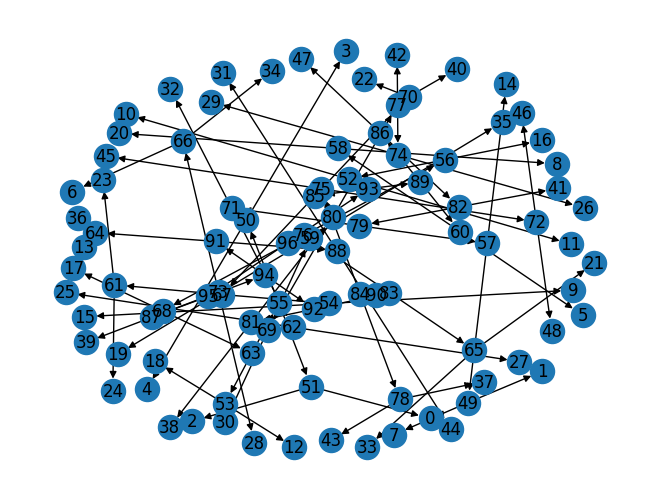

In [36]:
import pandas as pd
import networkx as nx

df = hierarchical_topics
# Create a directed graph
G = nx.DiGraph()

# Add edges to the graph
for row in df.itertuples(index=False):
    #G.add_edge(row.Parent_Name, row.Child_Left_Name, distance=row.Distance)
    #G.add_edge(row.Parent_Name, row.Child_Right_Name, distance=row.Distance)


    G.add_node(row.Child_Left_ID, color="green", label = row.Child_Left_Name, type = 'topic')
    G.add_node(row.Child_Right_ID, color="green", label = row.Child_Right_Name, type = 'topic')
    G.add_node(row.Parent_ID, color="grey", label = row.Parent_Name, type = 'hierarchy')
    #G.add_node("A", color="blue", weight=2)
    
    G.add_edge(row.Parent_ID, row.Child_Left_ID, distance=row.Distance, type = 'hierarchy')
    G.add_edge(row.Parent_ID, row.Child_Right_ID, distance=row.Distance, type = 'hierarchy')
# Save the graph in GraphML format
nx.write_graphml(G, save_path+"hierarchical_topics_graph_"+generate_random_name(4)+".graphml")
# Draw the network graph
print('Hierachical Graph')
nx.draw(G, with_labels=True)

### Merge Graphs

In [37]:
###python
import networkx as nx

# Load the first graph from topic_graph_afgq.graphml
graph1 = nx.read_graphml(save_path+"topic_graph_eaml.graphml")

# Load the second graph from hierarchical_topics_graph_ioxl.graphml
graph2 = nx.read_graphml(save_path+"hierarchical_topics_graph_hiig.graphml")

# Merge both graphs
graph_merged = nx.compose(graph1, graph2)

# Save the merged graph to graphml
nx.write_graphml(graph_merged, save_path+"topic_hierarchy_merged_"+generate_random_name(4)+".graphml")

### --> to Cytoscape

### Add Gene-Topic Network

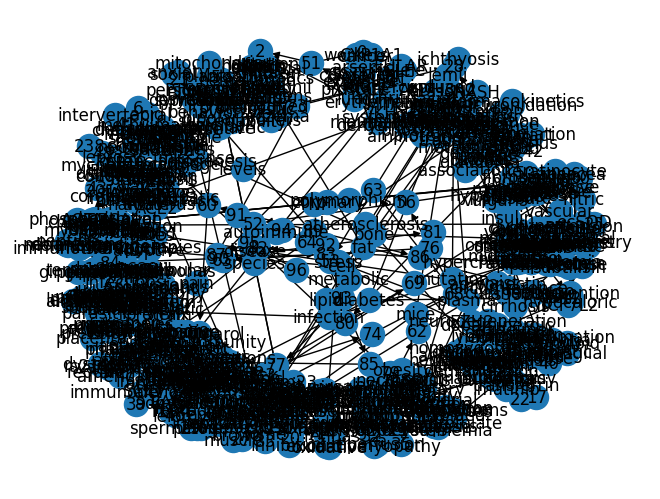

In [39]:
%%time
import networkx as nx
graph_merged = nx.read_graphml(save_path+"topic_hierarchy_merged.graphml")
nx.draw(graph_merged, with_labels=True)

In [40]:
%%time 
# Create a directed graph
G = graph_merged
topics = topic_info.Topic.to_list()

for node in topics[1:]:
    node_name = node#G.nodes[str(node)]['name']
    #if check_convertible(node_name):
    gene_topic = get_genes(int(node_name)).to_list()
    for gene in gene_topic:
        G.add_node(gene, color="purple", label = 'gene', type= 'gene')
        G.add_edge(gene, node_name, type='gene')

# Save the graph in GraphML format
nx.write_graphml(G, save_path+"topic_hierarchy_"+generate_random_name(4)+"_GENES.graphml")
# Draw the network graph
print('Topic Graph')
#nx.draw(G, with_labels=True)

Topic Graph
CPU times: total: 46 s
Wall time: 47.5 s


### Add PMID-url-Topic Network

In [31]:
%%time
G= None
import networkx as nx
graph_merged = nx.read_graphml(save_path+"topic_hierarchy_lwdb_GENES.graphml")
#nx.draw(graph_merged, with_labels=True)

CPU times: total: 1.34 s
Wall time: 1.34 s


In [41]:
%%time
def link_maker(pmid):
    link = 'https://pubmed.ncbi.nlm.nih.gov/'+pmid+'/'
    return link

# select topic for graph
topics = topic_info.Topic.to_list()
topic_graph = pertinent_topics # add only pertinent topic
topic_graph = topics[1:]

# Create a directed graph
G = graph_merged

for node in topic_graph:#topics[1:]:
    node_name = node#G.nodes[str(node)]['name']
    #if check_convertible(node_name):
    #gene_topic = get_genes(int(node_name)).to_list()
    pmid_topic = get_pmids(int(node_name)).to_list()    
    pmid_links = [link_maker(str(pmid_topic)) for pmid_topic in pmid_topic]
    #print(pmid_links)
    for link in pmid_links:
        pmid = str(re.search(r'\d+', link).group())
        #print(pmid)
        G.add_node(pmid, url=link, label = 'pmid', type='pmid')
        G.add_edge(pmid, node_name, type='pmid')

# Save the graph in GraphML format
nx.write_graphml(G, save_path+"topic_hierarchy_"+generate_random_name(4)+"_GENE_PMID.graphml")
# Draw the network graph
print('Topic Graph')
#nx.draw(G, with_labels=True)

Topic Graph
CPU times: total: 2.19 s
Wall time: 4.59 s


In [64]:
topic_model.get_topic_info()

,Topic,Count,Name,CustomName,Representation,Representative_Docs
0,-1,13124,-1_cell_diabetes_human_levels,-1 cell diabetes human level,"[cell, diabetes, human, levels, mutations, pro...",[18399716 $ BACKGROUND: the relevance to coron...
1,0,2549,0_cancer_GSTM1_prostate_exposure,0 cancer GSTM1 prostate expo,"[cancer, GSTM1, prostate, exposure, arsenic, c...",[23977100 $ BACKGROUND: glutathione s-transfer...
2,1,1774,1_alzheimer_synuclein_parkinson_tau,1 alzheimer synuclein parkin,"[alzheimer, synuclein, parkinson, tau, amyloid...",[23374228 $ BACKGROUND: alzheimer's disease (A...
3,2,1710,2_allergic_ige_atopic_COPD,2 allergic ige atopic COPD,"[allergic, ige, atopic, COPD, airway, children...",[33179333 $ BACKGROUND: interleukin 10 has bee...
4,3,1157,3_NASH_liver_nonalcoholic_fibrosis,3 NASH liver nonalcohol fibr,"[NASH, liver, nonalcoholic, fibrosis, steatosi...",[25543233 $ BACKGROUND: host genetic factors h...
5,4,1076,4_hepatitis_HCC_cirrhosis_IL28B,4 hepatitis HCC cirrhosis IL,"[hepatitis, HCC, cirrhosis, IL28B, PBC, infect...",[25013899 $ OBJECTIVE: to establish the role o...
6,5,1049,5_redox_heme_oxidation_disulfide,5 redox heme oxidation disul,"[redox, heme, oxidation, disulfide, site, ER, ...",[22187934 $ reactive oxygen and nitrogen speci...
7,6,1007,6_deficiency_carnitine_methylmalonic_dehydroge...,6 deficiency carnitine methy,"[deficiency, carnitine, methylmalonic, dehydro...",[26110041 $ BACKGROUND: short-chain acyl-coa d...
8,7,958,7_G93A_amyotrophic_sclerosis_cord,7 G93A amyotrophi sclerosis,"[G93A, amyotrophic, sclerosis, cord, dismutase...",[27551074 $ mutations in superoxide dismutase ...
9,8,887,8_DNA_repair_p53_ATM,8 DNA repair p53 ATM,"[DNA, repair, p53, ATM, pol, chromatin, breaks...",[19621083 $ cellular response to DNA damage in...


### Update graph

In [116]:
import pychatgpt as op

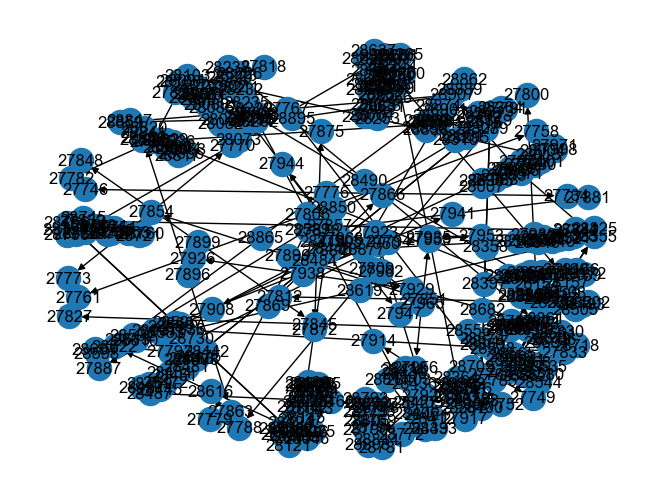

In [129]:
###python
import networkx as nx
graph_merged = nx.read_graphml(save_path+"merged_graph_cyto.graphml")
nx.draw(graph_merged, with_labels=True)

In [0]:
for node in graph_merged.nodes:
    print(graph_merged.nodes[node]['name'])

In [9]:
def check_convertible(input_str):
    try:
        int(input_str)
        return True
    except ValueError:
        return False

In [0]:
# Adding 'pmid' attribute to each node in the graph using a DataFrame mapping names to pmid values

import networkx as nx
import pandas as pd

# Assuming pmid_df is a DataFrame containing names associated with pmid values
# Assuming graph_merged is already loaded and nx.read_graphml() method returns a MultiGraph

# Dictionary mapping names to pmid values
#pmid_mapping = pmid_df.set_index('Name')['pmid'].to_dict()

# Updating the 'pmid' attribute for each node in the graph
for node in graph_merged.nodes:
    node_name = graph_merged.nodes[node]['name']
    #graph_merged.nodes[node]['pmid'] = ''
    if check_convertible(node_name):
        if int(node_name) in topics:#pertinent_topics:
            # Get the pmid value associated with the node's name
            #pmid_value = pmid_mapping.get(node_name, None)
            pmid_value = get_pmids(int(node_name)).to_list()
            gene_value = get_genes(int(node_name)).to_list()
            #if pmid_value:
            #print('hit')#pmid_value)
            graph_merged.nodes[node]['pmid'] = str(pmid_value)
            graph_merged.nodes[node]['gene'] = str(gene_value)
            #else:
            #    graph_merged.nodes[node]['pmid'] = 'Unknown'

            #G.nodes[1]['shape'] = 'circle'
            #G.nodes[2]['shape'] = 'square'
            
nx.draw(graph_merged, with_labels=True)
nx.write_graphml(graph_merged, save_path+"merge_update_"+generate_random_name(4)+".graphml")

## Topic Evaluation
thanks to Semantic Grpah Querying

Results:
- based on 251 Mesh, we retieverd 37.000 pepers from GRPM Dataset
- Topic Modeling on abstracts, we got 50 Topics
- Topic Evaluation, from 50 Topics to X0 topics
- from 37.000 paper to 10.238 papers, XX.000 excluded and 13.YYY outliers
- from 8.280 genes to 3.911 genes (cross papers with GRPM ds)
- get genes network for selected topics 

### Curated Topic Evaluation  

In [36]:
topics = topic_model.get_topic_info().Topic.to_list()

# new model 10-05-2024, new mapping of the same topics
pertinent_topics = [3, 4, 5, 6, 8, 10, 12, 13, 17, 18, 20, 25, 27, 30, 31, 32, 33, 34, 35, 42, 47]
non_pertinent_topics = [topic for topic in topics if topic not in pertinent_topics]

print('Selected Topics:')
topic_model.get_topic_info()[topic_model.get_topic_info().Topic.isin(pertinent_topics)]

Selected Topics:


,Topic,Count,Name,CustomName,Representation,Representative_Docs
4,3,1157,3_NASH_liver_nonalcoholic_fibrosis,3 NASH liver nona,"[NASH, liver, nonalcoholic, fibrosis, steatosi...",[25543233 $ BACKGROUND: host genetic factors h...
5,4,1076,4_hepatitis_HCC_cirrhosis_IL28B,4 hepatiti HCC ci,"[hepatitis, HCC, cirrhosis, IL28B, PBC, infect...",[25013899 $ OBJECTIVE: to establish the role o...
6,5,1049,5_redox_heme_oxidation_disulfide,5 redox heme oxid,"[redox, heme, oxidation, disulfide, site, ER, ...",[22187934 $ reactive oxygen and nitrogen speci...
7,6,1007,6_deficiency_carnitine_methylmalonic_dehydroge...,6 deficien carnit,"[deficiency, carnitine, methylmalonic, dehydro...",[26110041 $ BACKGROUND: short-chain acyl-coa d...
9,8,887,8_DNA_repair_p53_ATM,8 DNA repair p53,"[DNA, repair, p53, ATM, pol, chromatin, breaks...",[19621083 $ cellular response to DNA damage in...
11,10,740,10_colitis_UC_celiac_bowel,10 colitis UC cel,"[colitis, UC, celiac, bowel, ulcerative, glute...",[27492617 $ BACKGROUND & AIMS: genome-wide ass...
13,12,665,12_insulin_obesity_fat_diabetes,12 insulin obesit,"[insulin, obesity, fat, diabetes, BMI, diet, f...",[29859275 $ OBJECTIVE: the aim of this study w...
14,13,597,13_CYP2C19_drug_p450_CYP,13 CYP2C19 drug p,"[CYP2C19, drug, p450, CYP, cytochrome, POR, tr...",[27516201 $ the cytochrome p450 drug metaboliz...
18,17,393,17_iron_overload_hemochromatosis_h63d,17 iron overload,"[iron, overload, hemochromatosis, h63d, hepcid...",[14571105 $ BACKGROUND/AIMS: hereditary hemoch...
19,18,367,18_coronary_CHD_fibrinogen_reactive,18 coronary CHD f,"[coronary, CHD, fibrinogen, reactive, MI, ACS,...",[33527329 $ coronary artery disease is an infl...


### Get Representative Docs

In [95]:
#Get Representative_document abstracts for pertinent topics
doc_info_s_rep = doc_info_s[doc_info_s.Representative_document==True]
doc_info_s_rep_pert = doc_info_s_rep[doc_info_s_rep.Topic.isin(pertinent_topics)]
#doc_info_s_rep_pert.Abstract.to_list()
#pc.copy(str(doc_info_s_rep_pert.Abstract.to_list()))
#pc.copy(str(doc_info_s_rep_pert.pubmed_id.to_list()))

In [40]:
%%time
# visualize_documents (sample)
if 'embeddings' not in locals():
    embedding_file = 'nbib_subset_clean_251_embeddings_v2.txt'
    embeddings = np.loadtxt(save_path+embedding_file)

#topic_model.set_topic_labels(topic_info['CustomLabel_GPT4'].to_list())
topic_model.set_topic_labels(generate_labels(4, 8, 18))
topic_model.visualize_documents(docs_processed, topics= pertinent_topics, embeddings=embeddings,sample= 0.1, custom_labels=True)
                                #width = 1400, height = 850)

CPU times: total: 1min 13s
Wall time: 59.4 s


In [46]:
# Evaluation Results
topic_info_pertinent = topic_info[['Topic', 'Count','CustomName', 'Representation']][topic_info.Topic.isin(pertinent_topics)]
doc_info_s_pertinent = doc_info_s[doc_info_s.Topic.isin(pertinent_topics)]

total_count = topic_info.Count.sum()
pertinent_count = topic_info_pertinent.Count.sum()
outliers = topic_info.Count[0]
non_pertinent_count = total_count-outliers-pertinent_count

print('total count:', total_count)
print('outliers count:', outliers)
print('non pertinent count:', non_pertinent_count)
print('pertinent count:', pertinent_count)
'''
import plotly.express as px
data = {
    'Type': ['Pertinent Count', 'Non-Pertinent Count', 'Outliers'],
    'Value': [pertinent_count, non_pertinent_count, outliers]
}
fig = px.treemap(data, path=['Type'], values='Value', title='Treemap')
fig.show()
'''
import matplotlib.pyplot as plt
import squarify
labels = ['Pertinent Count', 'Non-Pertinent Count', 'Outliers']
sizes = [pertinent_count, non_pertinent_count, outliers]
colors = ['green', 'red', 'grey']

plt.figure(figsize=(4, 4))  
squarify.plot(sizes=sizes, label=labels, color=colors, alpha=0.7)
#plt.axis('off')
#plt.title('Treemap')
plt.savefig('evaluation_placeholder.png', dpi=300)
plt.show()

topic_info_pertinent#.describe()

KeyError: "['CustomName'] not in index"

## Output Dataset 
### Output Dataset Stats

In [65]:
filteres_grpm = grpm_dataset[grpm_dataset.mesh.isin(list_mesh)]
filteres_grpm = filteres_grpm[['gene', 'rsid', 'pmids', 'mesh']].drop_duplicates()
filteres_grpm.describe().to_clipboard()

pertinent_pmid = doc_info[doc_info.Topic.isin(pertinent_topics)].pubmed_id
modeled_grpm = grpm_dataset[grpm_dataset.pmids.isin(pertinent_pmid)]

print('Filtered by MeSH')
display(filteres_grpm.describe())
print('Selected by Topic')
display(modeled_grpm.describe())

Filtered by MeSH


,gene,rsid,pmids,mesh
count,163628,163628,163628,163628
unique,8270,45456,37516,251
top,TNF,rs1800629,34578986,Inflammation
freq,3915,2012,832,13179


Selected by Topic


,gene,rsid,pmids,mesh,qualifier,major
count,590557,590557,590557,590557,299944,590557
unique,3961,14555,10221,8415,75,2
top,PNPLA3,rs738409,21712189,Humans,genetics,False
freq,14139,12315,6952,30250,109234,441981


### Get and Enrich Output Dataset

In [99]:
%%time
output_ds = doc_info_s_pertinent[['Topic', 'pubmed_id', 'Abstract', 'Name', 'Representation']]

# filter NBIB
filterd_nbib = nbib_subset_clean[['pubmed_id','title','abstract', 'keywords', 'descriptors']].drop_duplicates()
filterd_nbib.pubmed_id = filterd_nbib.pubmed_id.astype(str)
output_nbib = filterd_nbib[filterd_nbib.pubmed_id.isin(output_ds.pubmed_id)]
output_nbib#.to_csv(save_path+'RAG_LLM_nutrigentic_dataset.csv')

# MERGE NBIB & TOPICS
output_ds_topic = pd.merge(output_ds[['Topic', 'pubmed_id', 'Name', 'Representation']], output_nbib, on='pubmed_id')
output_ds_topic.rename(columns={'Topic':'topic_id', 'pubmed_id':'pubmed_id', 'Name':'topic_name', 'Representation':'topic_representation'}, inplace=True)
output_ds_topic#.to_csv(save_path+'output_dataset_bertopic_nutrigentics.csv')

# MERGE NBIB-TOPICS & GENE-RSID
df = modeled_grpm[['gene', 'rsid', 'pmids']]
transformed_df = df.groupby('pmids').aggregate({'rsid': lambda x: list(x), 'gene': lambda x: list(x)}).reset_index()
transformed_df[['pmids', 'rsid', 'gene']]

output_ds_topic_gene_rsid = pd.merge(output_ds_topic, transformed_df, left_on='pubmed_id', right_on='pmids')
output_ds_topic_gene_rsid.rename(columns={'gene':'genes', 'rsid':'rsids'}, inplace=True)
output_ds_topic_gene_rsid.drop(columns='pmids', inplace=True)
output_ds_topic_gene_rsid = output_ds_topic_gene_rsid[['topic_id', 'pubmed_id', 'topic_name', 'topic_representation', 'title','abstract', 'keywords', 'descriptors', 'genes', 'rsids']]
output_ds_topic_gene_rsid

CPU times: total: 3.77 s
Wall time: 9.3 s


,topic_id,pubmed_id,topic_name,topic_representation,title,abstract,keywords,descriptors,genes,rsids
0,20,34065857,20_p53_cisplatin_ROS_ferroptosis,"[p53, cisplatin, ROS, ferroptosis, tumor, nm23...",The Role of Mitochondria in Carcinogenesis.,The mitochondria are essential for normal cell...,"['cancer', 'mtDNA', 'mutagenesis', 'polymorphi...","[{'descriptor': 'DNA, Mitochondrial', 'qualifi...","[MT-ND1, MT-ND1, MT-ND1, MT-ND1, MT-ND1, MT-ND...","[rs1599988, rs1599988, rs1599988, rs1599988, r..."
1,33,28906532,33_ventricular_ryr2_cardiomyopathy_tachycardia,"[ventricular, ryr2, cardiomyopathy, tachycardi...",The aetiology of cardiovascular disease: a rol...,Cardiovascular disease (CVD) is a world-wide c...,NaN,"[{'descriptor': 'Africa', 'qualifier': 'epidem...","[MT-ND1, MT-ND1, MT-ND1, MT-ND1, MT-ND1, MT-ND...","[rs199476118, rs199476118, rs199476118, rs1994..."
2,4,32575796,4_redox_heme_electron_disulfide,"[redox, heme, electron, disulfide, oxidation, ...",Multifaceted Roles of Mitochondrial Components...,Mitochondria are essential cellular components...,"['cancer', 'electron transport chain (ETC)', '...","[{'descriptor': 'Citric Acid Cycle', 'major': ...","[MT-ND1, MT-ND1, MT-ND1, MT-ND1, MT-ND1, MT-ND...","[rs199476118, rs199476118, rs199476118, rs1994..."
3,3,34656796,3_deficiency_dehydrogenase_carnitine_methylmal...,"[deficiency, dehydrogenase, carnitine, methylm...",Identification of a novel m.3955G > A variant ...,Leigh syndrome (LS) is one of the most common ...,"['Cybrid cells', 'Leigh syndrome', 'MT-ND1', '...","[{'descriptor': 'Electron Transport', 'qualifi...","[MT-ND1, MT-ND1, MT-ND1, MT-ND1, MT-ND1, MT-ND...","[rs28552781, rs28552781, rs28552781, rs2855278..."
4,20,33865346,20_p53_cisplatin_ROS_ferroptosis,"[p53, cisplatin, ROS, ferroptosis, tumor, nm23...",Mitochondrial DNA abnormalities provide mechan...,BACKGROUND: Associations between mitochondrial...,"['Cancer biomarker', 'Cisplatin', 'Dequalinium...","[{'descriptor': 'Antineoplastic Agents', 'qual...","[MT-ND1, MT-ND1, MT-ND1, MT-ND1, MT-ND1, MT-ND...","[rs1599988, rs1599988, rs1599988, rs1599988, r..."
...,...,...,...,...,...,...,...,...,...,...
9904,42,25757111,42_OA_osteoarthritis_cherubism_bone,"[OA, osteoarthritis, cherubism, bone, KI, SH3B...",Mitochondrial damage-associated molecular patt...,BACKGROUND: No known biologic mechanisms link ...,NaN,"[{'descriptor': 'Animals', 'major': False}, {'...","[CXCL8, CXCL8, CXCL8, CXCL8, CXCL8, CXCL8, CXC...","[rs763440988, rs763440988, rs763440988, rs7634..."
9905,5,25630041,5_hepatitis_HCC_cirrhosis_IL28B,"[hepatitis, HCC, cirrhosis, IL28B, PBC, infect...",The effect of HAART-induced HIV suppression on...,OBJECTIVES: To investigate the impact of HAART...,NaN,"[{'descriptor': 'Adult', 'major': False}, {'de...","[CXCL8, CXCL8, CXCL8, CXCL8, CXCL8, CXCL8, CXC...","[rs572157399, rs572157399, rs572157399, rs5721..."
9906,5,22335768,5_hepatitis_HCC_cirrhosis_IL28B,"[hepatitis, HCC, cirrhosis, IL28B, PBC, infect...",The IL-8 gene polymorphisms and the risk of th...,Interleukin-8 (IL-8) belongs to the superfamil...,NaN,"[{'descriptor': 'Adult', 'major': False}, {'de...","[CXCL8, CXCL8, CXCL8, CXCL8, CXCL8, CXCL8, CXC...","[rs2227306, rs2227306, rs2227306, rs2227306, r..."
9907,5,24381110,5_hepatitis_HCC_cirrhosis_IL28B,"[hepatitis, HCC, cirrhosis, IL28B, PBC, infect...",Association of interleukin-8 gene polymorphism...,Interleukin-8 (IL8) polymorphisms have been im...,NaN,"[{'descriptor': 'Adult', 'major': False}, {'de...","[CXCL8, CXCL8, CXCL8, CXCL8, CXCL8, CXCL8, CXC...","[rs2227306, rs2227306, rs2227306, rs2227306, r..."


In [100]:
output_ds_topic_gene_rsid.to_csv(save_path+'output_dataset_bertopic_nutrigentics_052024.csv')

### Load Enriched Output Dataset

In [ ]:
output_ds_topic_gene_rsid = pd.read_csv(save_path+'output_dataset_bertopic_nutrigenetics_052024.csv', index_col=0)
output_ds_topic_gene_rsid

In [102]:
# get enriched representative docs
topic_id = 3
doc_info_s_rep_pmid_bool = doc_info_s_rep[['pubmed_id', 'Representative_document']]
output_ds_topic_gene_rsid[output_ds_topic_gene_rsid.topic_id==topic_id]

# filter for representative docs
output_ds_topic_gene_rsid_rep = output_ds_topic_gene_rsid[output_ds_topic_gene_rsid.pubmed_id.isin(doc_info_s_rep_pmid_bool.pubmed_id)]
output_ds_topic_gene_rsid_rep[output_ds_topic_gene_rsid.topic_id==topic_id][['title','abstract','keywords']]

,title,abstract,keywords
1574,Clinical and genetic characteristics of patien...,BACKGROUND: Fatty acid oxidation disorders (FA...,"['Fatty acid oxidation disorders', 'Genotype-p..."
5548,An unusually high frequency of SCAD deficiency...,BACKGROUND: Short-chain acyl-CoA dehydrogenase...,"['C4-acylcarnitine', 'Ethylmalonic acid', 'Fre..."
8597,"Biochemical, molecular, and clinical character...",BACKGROUND: Short-chain acyl-CoA dehydrogenase...,NaN


### Extras

In [ ]:
# to latex
df = topic_info[['Topic', 'Count', 'CustomLabel_GPT3.5']]
df['CustomLabel_GPT3.5']=df['CustomLabel_GPT3.5'].str.replace(r'^.*?\.', '', regex=True)
df_isin = df[df.Topic.isin(pertinent_topics)]

latex_table = df_isin.to_latex(index=False,caption='Pertinent Topics')
import pyperclip as pc
pc.copy(latex_table)

In [ ]:
# Return top n words for a specific topic and their c-TF-IDF scores
print('Top n words for a specific topic and their c-TF-IDF scores')
for topic_id in pertinent_topics:
    topic = topic_model.get_topic(topic_id, full=False)
    print('\n',topic_info.CustomName[topic_id])
    print(pd.DataFrame(topic))#[1].sum()

The argument with id -1 groups  all unattributed abstracts. We will ignore it.

# Display Results

### Visualize Probablities or Distribution¶


In [ ]:
# To visualize the probabilities of topic assignment
import plotly.graph_objects as go
fig = go.Figure()
for n in range(3):
    fig = topic_model.visualize_distribution(probs[n],
                                             min_probability = 0,
                                             custom_labels = False)
    fig.show()

In [ ]:
!pip install jinja2

In [ ]:
# Calculate the topic distributions on a token-level
topic_distr, topic_token_distr = topic_model.approximate_distribution(docs_processed, calculate_tokens=True, min_similarity=0)

In [ ]:
# Visualize the token-level distributions
topic_n = 4
df = topic_model.visualize_approximate_distribution(docs_processed[topic_n], topic_token_distr[topic_n])
df

In [ ]:
topic_n = 2
doc_info[doc_info.Document == docs_processed[topic_n]].reset_index().sort_values(by='index')#.head()#.T

### Similarity Matrix
Having generated topic embeddings, through both c-TF-IDF and embeddings, we can create a similarity matrix by simply applying cosine similarities through those topic embeddings. The result will be a matrix indicating how similar certain topics are to each other.

In [ ]:
!pip install -U kaleido

In [103]:
import plotly.graph_objects as go
import matplotlib.pyplot as plt
def show_similarty(topics):
    fig = go.Figure()
    fig = topic_model.visualize_heatmap(topics=topics,
                                        top_n_topics = 51,
                                        #n_clusters = 20,
                                        custom_labels=True,
                                        width = 1100,
                                        height = 1100)
    #fig.write_image("fig1.png", engine='kaleido')
    fig.show()
    
show_similarty(None) # this is correct, in-line with the Intertopic distance map
#show_similarty(topic_info.Topic[:len(topic_info.Topic)-10]) # !!! reorder topic doesn't work
#show_similarty(hierarchy[:len(hierarchy)]) # !!! reorder topic doesn't work
#show_similarty(pertinent_topics) # !!! cherry-picking topics doesn't work
#show_similarty([7, 24,0,1,34,14,23]) 
#show_similarty([7, 14,20,14,3,4,2])
# Conclusion: the heatmap is fixed 

### Similarity Matrix (custom)

In [ ]:
pertinent_topics.sort()
pertinent_topics

In [59]:
import numpy as np
import plotly.express as px
from sklearn.metrics.pairwise import cosine_similarity

topic_model.set_topic_labels(generate_labels(4, 8, 20, pad=True,common_length = 28 ))

distance_matrix = cosine_similarity(np.array(topic_model.topic_embeddings_)[1:, :])

# get labels
labels = topic_info[topic_info.Topic.isin(pertinent_topics)].CustomName.apply(lambda x: x[:23])
# Filter rows and columns based on indices
pertinent_topics.sort()
rows_to_keep = pertinent_topics
cols_to_keep = pertinent_topics
filtered_distance_matrix = distance_matrix[np.ix_(rows_to_keep, cols_to_keep)]

fig = px.imshow(filtered_distance_matrix,
                labels=dict(color="Similarity Score"),
                x=labels,
                y=labels,
                color_continuous_scale='GnBu'
                )
title: str = "<b>Similarity Matrix</b>"
fig.update_layout(
    title={
        'text': f"{title}",
        'y': .95,
        'x': 0.55,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(
            size=22,
            color="Black")
    },
    width=800,
    height=800,
    hoverlabel=dict(
        bgcolor="white",
        font_size=16,
        font_family="Rockwell"
    ),
)
fig.update_layout(showlegend=True)
fig.update_layout(legend_title_text='Trend')
fig.write_image("heatmap_short_2024.png", engine="kaleido", scale=3)
fig.show()

## Hierarchy Visualization

In [94]:
# Display pertinent topic clustering tree
topic_model.visualize_hierarchy(custom_labels=True, topics=pertinent_topics, width=700, height=600) #The topics that were created can be hierarchically reduced.

## Terms Visualization

### Wordclouds

In [171]:
# Show wordcloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordcloud(model, topic):
    text = {word: value for word, value in model.get_topic(topic)}
    print(text)
    wc = WordCloud(background_color="white", max_words=1000, width=800, height=400)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

def create_wordcloud_multiple(topics, output_path='wordcloud.png', dpi=300, save=True):
    merged_dict = {}
    for i in topics:
        text = {word: value for word, value in topic_model.get_topic(i)}
        merged_dict.update(text)
    #pc.copy(str(merged_dict))

    plt.figure(figsize=(12, 8))

    wc = WordCloud(background_color="white", max_words=1000, width=1000, height=500)
    wc.generate_from_frequencies(merged_dict)

    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    if save:
        plt.savefig(output_path, dpi=dpi, bbox_inches='tight')
    plt.show()

def create_wordcloud_from_corpus(corpus, output_path='wordcloud.png', dpi=300, save=True, replace=False):
    # Combine the text corpus into a single string
    text = ' '.join(corpus)
    # Generate WordCloud from the text
    wc = WordCloud(background_color="white", max_words=1000, width=800, height=400)
    wc.generate(text)
    # Display the WordCloud
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    if save:
        plt.savefig(output_path, dpi=dpi, bbox_inches='tight')
    plt.show()

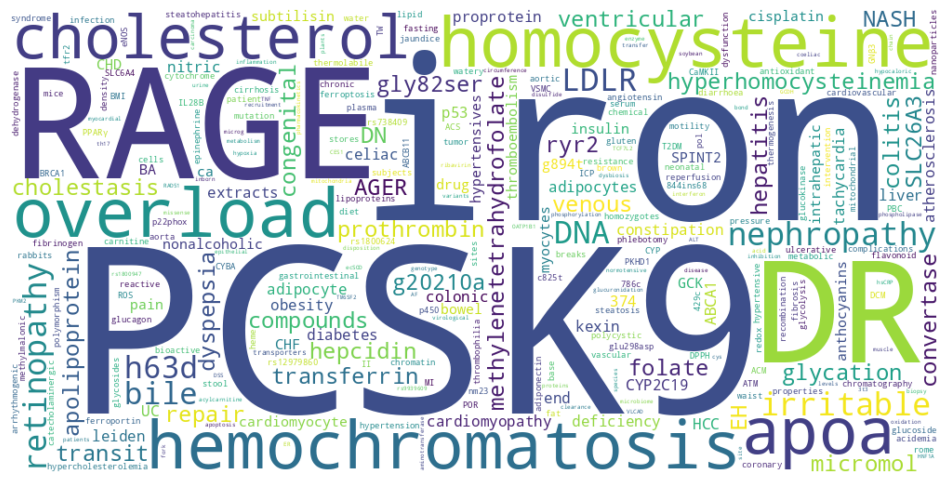

In [175]:
create_wordcloud_multiple(pertinent_topics, dpi=500, save = True,output_path=save_path+'wordcloud_topics_pert.png')

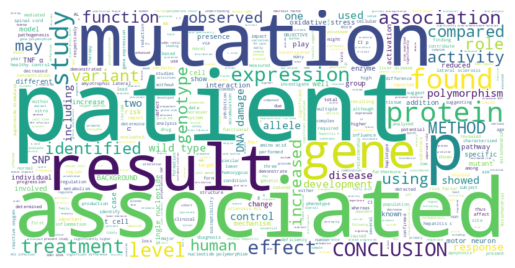

In [174]:
# create_wordcloud_from_corpus
create_wordcloud_from_corpus(doc_info_s_pertinent.Abstract.to_list(), dpi=500, save = True,output_path=save_path+'wordcloud_abstracts_pert.png')

In [ ]:
# Show wordcloud
for i in pertinent_topics[:2]:
    print('')
    create_wordcloud(topic_model, topic=i)

### Topic Word score (c-TF-IDF)

In [ ]:
# show the selected terms for a few topics by creating bar charts out of the c-TF-IDF scores.
topic_model.visualize_barchart(n_words = 20, 
                               topics = pertinent_topics,
                               #top_n_topics=len(topic_info)//4,
                              )  

### Term Score Decline 

In [ ]:
#Term Score Decline 
# [TF-IDF — Term Frequency-Inverse Document] #https://www.capitalone.com/tech/machine-learning/understanding-tf-idf/
#Each topic is represented by a set of words.
#These words, however, do not all equally represent the topic.
#This visualization shows how many words are needed to represent a topic and at which point the beneficial effect of adding words starts to decline.
# https://maartengr.github.io/BERTopic/getting_started/ctfidf/ctfidf.html
topic_model.visualize_term_rank()#(log_scale=True)

## Topic Over Time

In [104]:
# prepocess dates
import re
if 'nbib_subset_clean' not in globals():
    print("loading 'nbib_subset_clean'...")
    nbib_subset_clean = pd.read_csv(save_path+'nbib_subset_clean_251.csv', index_col=0)
df_crop = nbib_subset_clean[['pubmed_id','publication_date']].drop_duplicates()
dates = df_crop.publication_date.to_list()
years = [date.split(' ')[0].split("-")[0] for date in dates]
len(years)

for idx, date in enumerate(dates):
  dates[idx] = " ".join(date.split(" ")[:2]).split("-")[0].strip().split("/")[0].strip()
    
for i in range(len(dates)):
    if len(dates[i]) == 4: 
        dates[i] += ' Jan'
        
dates[:10]
'''
converted_dates = []
import datetime
for date in dates:
    try:
        dt = datetime.datetime.strptime(date, "%Y %b")
        converted_dates.append(dt.strftime("%m/%Y"))
    except ValueError:
        converted_dates.append('Invalid Date')
converted_dates[:10]
'''
len(years), len(docs_processed)
#pd.Series(years).drop_duplicates().sort_values(ascending=False)

(37042, 37042)

In [105]:
%%time
datetime_formats = ['%Y %b',"%Y"]
#topics, probs = topic_model_t.fit_transform(docs_processed,embeddings)
topics_over_time = topic_model.topics_over_time(docs_processed, 
                                                  years, 
                                                  datetime_format= datetime_formats[1],
                                                  global_tuning=True, 
                                                  evolution_tuning=True)

CPU times: total: 2min 27s
Wall time: 2min 25s


In [106]:
topics_over_time

,Topic,Words,Frequency,Timestamp
0,-1,"onc, mht, 6328488, colinear, MSV",1,1984-01-01
1,24,"hybridomas, HA1, determinants, RV6, virus",1,1984-01-01
2,6,"tangier, preproapo, apo, pMDB136T, isosteric",1,1985-01-01
3,-1,"hepatoerythropoietic, porphyria, cutanea, tard...",1,1986-01-01
4,-1,"DHFR, rainbow, trout, gonorrhoeae, acclimation",2,1987-01-01
...,...,...,...,...
1185,43,"coronavirus, SCFAs, overreactions, endotheliit...",2,2022-01-01
1186,45,"rs10370, DF, fluoride, tongxu, fluorosis",1,2022-01-01
1187,48,"uyghur, tuberculosis, xinjiang, IFNGR1, CTAGE1",1,2022-01-01
1188,-1,"IGF1, IGFBP3, rs3110697, underrepresented, 154",1,2023-01-01


In [107]:
#topic_model_t.visualize_topics_over_time(topics_over_time[topics_over_time["Timestamp"]<2023],top_n_topics=10,width=1250,height=450).show()
#topic_model_t.visualize_topics_over_time(topics_over_time[topics_over_time["Timestamp"]<2023],top_n_topics=10,custom_labels = True, title = "<b>Topics over Time</b>", width=1400,height=800).show()

topic_model.visualize_topics_over_time(topics_over_time,
                                         top_n_topics=10,
                                         custom_labels = True,
                                         topics = pertinent_topics,
                                         normalize_frequency = False,
                                         title = "<b>Topics over Time</b>", 
                                         width=1400,
                                         height=800).show()

# Extras

## Alternative NBIB Preprocessors

In [ ]:
timea = time.time()

if simple_bool('Preprocess source dataset (slow preprocessor)'):
    nbib_subdataset = pd.DataFrame(columns= nbib_dataset.columns)

    num = len(nbib_dataset)
    for j in tqdm(range(len(nbib_dataset[:num]))):
        descriptors = ast.literal_eval(nbib_dataset.descriptors[j])
        descriptors_list =[]
        for i in range(len(descriptors)):
            descriptors_list.append(descriptors[i]['descriptor'])
        if any(term in descriptors_list for term in list_mesh):
            nbib_subdataset = pd.concat([nbib_subdataset, nbib_dataset.iloc[[j]]], ignore_index=True)
    print((time.time()-timea)/60,'minutes')

if simple_bool('Use alternative preprocessor (fast unaccurate)'):
    mesh = df_mesh['Preferred Label'].drop_duplicates().dropna().str.replace('+','')
    nbib_subdataset = nbib_dataset[nbib_dataset.descriptors.str.contains('|'.join(mesh[:len(mesh)]))]
    print((time.time()-timea)/60,'minutes')

if simple_bool('save output?'):
    nbib_subdataset.to_csv('data'+'nbib_subset'+str(mesh_count)+'.csv')

nbib_subdataset.pubmed_id.drop_duplicates()

## Train Model: Default setting

In [ ]:
# Run model
import time
from hdbscan.hdbscan_ import HDBSCAN

# Prepare embeddings
""" SentenceTransformers is a Python framework for state-of-the-art sentence, text and image embeddings. """
embedding_file = 'grpm_abs_embeddings_313_nonltk.txt'

if simple_bool('Load pre-generated embeddings?'):
    embeddings = np.loadtxt(save_path+embedding_file)
else:
    from sentence_transformers import SentenceTransformer

    sentence_model = SentenceTransformer("all-mpnet-base-v2")
    embeddings = sentence_model.encode(docs_processed,
                                       show_progress_bar=True)
print(embeddings[0][0:5])
print('type',type(embeddings))

#Find the optimal number of clusters with HDBscan
""" HDBSCAN: Hierarchical Density-Based Spatial Clustering of Applications with Noise """
timea = time.time()
hdbscan_model = HDBSCAN(min_cluster_size=100, #15
                        metric='euclidean',
                        cluster_selection_method='eom',
                        prediction_data=True)

timeb = time.time()
print((timeb - timea)/60, 'minutes')

# Run BERTopic
""" BERTopic is a topic modeling technique """
doc = docs #docs_processed

topic_model_HBDSCAN = BERTopic(hdbscan_model=hdbscan_model).fit(docs_processed, embeddings)

print((time.time() - timea)/60, 'minutes')
'''
LOG: GRPM EMBEDDING 17.000 ABS IN 18.797277983029684 minutes  
LOG: GRPM EMBEDDING 44.000 ABS IN 3.5 minutes on server <***>  
LOG: GRPM EMBEDDING 42.700 ABS IN 2.993170352776845 minutes on server <***>
'''

# Saving the array as a txt file   
if simple_bool('save grpm_abs_embeddings?'):
    np.savetxt(save_path+'grpm_abs_embeddings.txt', embeddings)

## accessory functions

In [ ]:
# Prepare data
umap_data = UMAP(n_neighbors=15, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)
result = pd.DataFrame(umap_data, columns=['x', 'y'])
result['labels'] = cluster.labels_

# Visualize clusters
fig, ax = plt.subplots(figsize=(20, 10))
outliers = result.loc[result.labels == -1, :]
clustered = result.loc[result.labels != -1, :]
plt.scatter(outliers.x, outliers.y, color='#BDBDBD', s=0.05)
plt.scatter(clustered.x, clustered.y, c=clustered.labels, s=0.05, cmap='hsv_r')
plt.colorbar()

## optimize labels

In [ ]:
from transformers import pipeline
classifier = pipeline("zero-shot-classification", model="facebook/bart-large-mnli") #base_embedder

# A selected topic representation
# 'god jesus atheists atheism belief atheist believe exist beliefs existence'
sequence_to_classify =  " ".join([word for word, _ in topic_model.get_topic(1)])

# Our set of potential topic labels
candidate_labels = ['brain', 'liver', 'cancer']

classifier(sequence_to_classify, candidate_labels)

#{'labels': ['cooking', 'dancing', 'religion'],
# 'scores': [0.086, 0.063, 0.850],
# 'sequence': 'god jesus atheists atheism belief atheist believe exist beliefs existence'}